In [892]:
import imageio.v3 as iio
import pandas as pd
from PIL import Image
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import ast
from itertools import combinations
from scipy import stats

In [646]:
# read in data frame with corresponding trial and image data
df = pd.read_csv("imagedf.csv", usecols=range(1,10))
print(df.head())

                                     subjID         levelID  gravX  gravY  \
0  connect-1DF28D04D4BC4AD0A9B59DD0E935393A       basic_far   0.00    2.5   
1  connect-1DF28D04D4BC4AD0A9B59DD0E935393A       basic_far   0.00    2.5   
2  connect-1DF28D04D4BC4AD0A9B59DD0E935393A       basic_far   0.00    2.5   
3  connect-1DF28D04D4BC4AD0A9B59DD0E935393A  boomerang_left   0.25    1.0   
4  connect-1DF28D04D4BC4AD0A9B59DD0E935393A  boomerang_left   0.25    1.0   

   radius  numAttempts  success  \
0      20            0     fail   
1      20            1     fail   
2      20            2  success   
3      30            0     fail   
4      30            1     fail   

                                             imageID  \
0  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img0.png   
1  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img1.png   
2  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img2.png   
3  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img3.png   
4  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_im

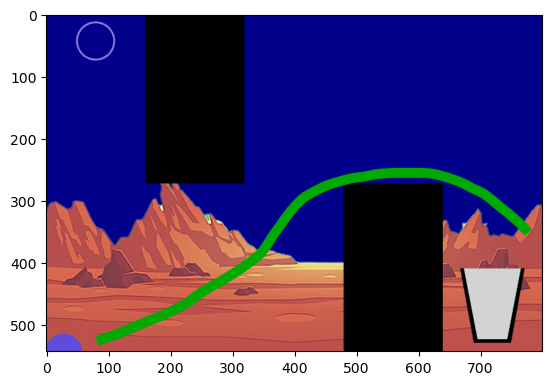

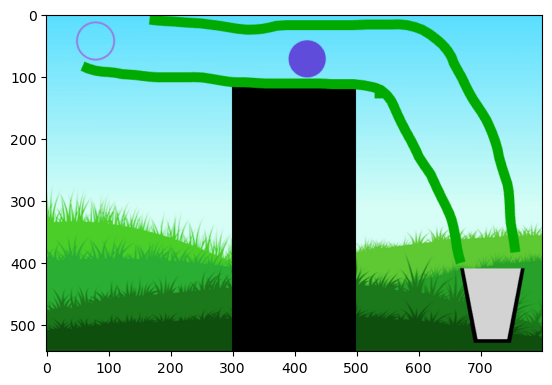

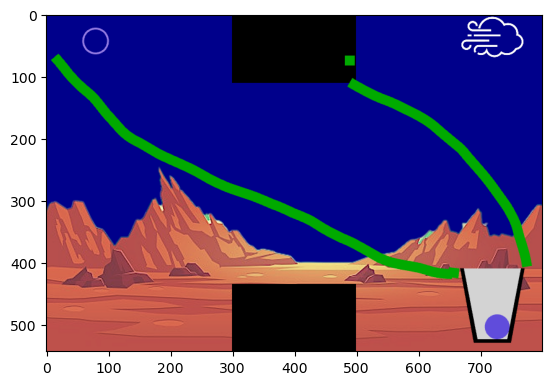

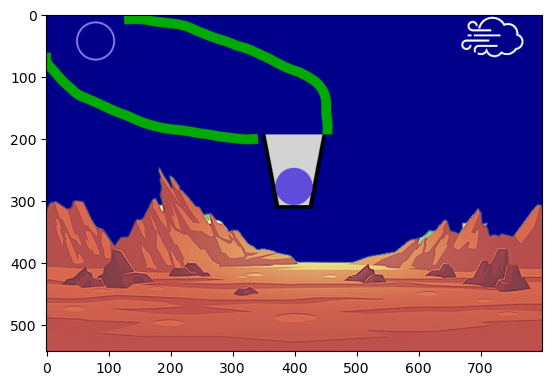

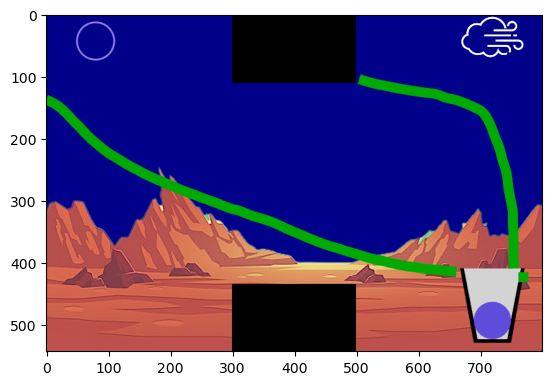

...

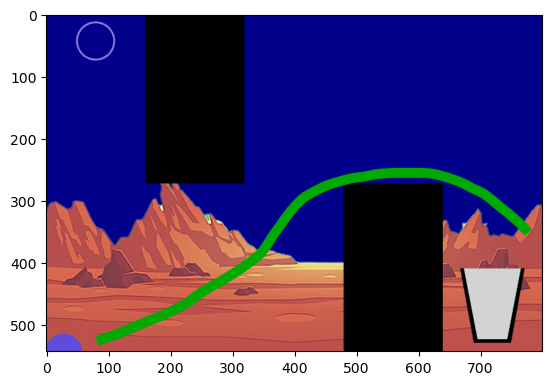

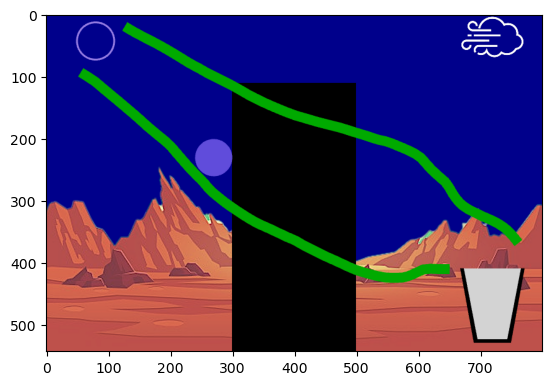

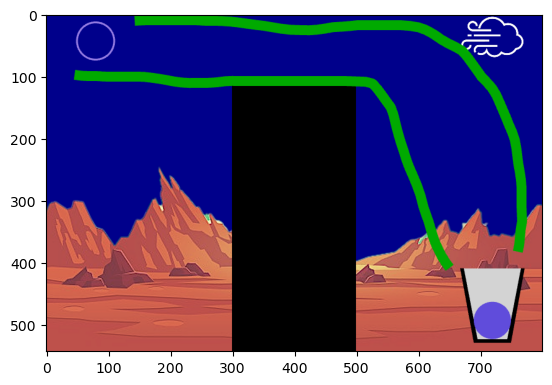

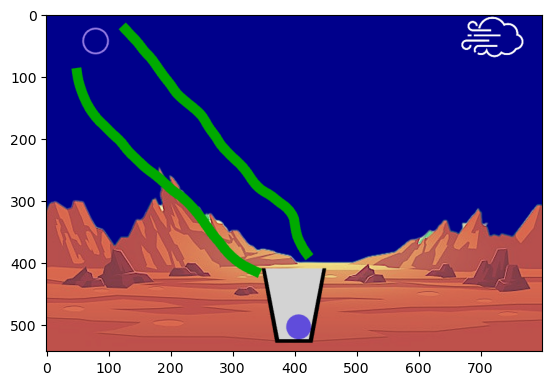

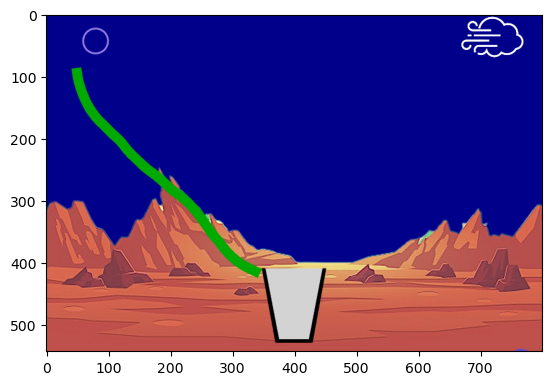

In [78]:
# test pulling up one participant's original images
for im_path in glob.glob("../../game/data/img/pilot1/connect-0F07CDB90B904FB79C385106E46337DE/*.png"):
    img = mpimg.imread(im_path)
    imgplot = plt.imshow(img[57:,:])
    plt.show()

# Convert image to binary

In [173]:
# function converts image to binary and return edited image
def toBinary(image):
    # convert image to numpy array
    img_array = np.array(image)

    # define green line that we are targeting
    target_color = np.array([0, 170, 0, 255])

    # binary mask where pixels matching the target color = True
    mask = np.all(img_array == target_color, axis=-1)
    
    # set pixels matching the target color to black and everything else to white
    img_array[mask] = [0, 0, 0, 255]  # Black
    img_array[~mask] = [255, 255, 255, 255]  # White

    # convert the NumPy array back to an image
    result_img = Image.fromarray(img_array)
    
    return result_img

In [234]:
# convert all images to binary
Dict = {}
for im_path in glob.glob("../../game/data/img/pilot1/*/*.png"):
    # get subject ID info
#     subjID = im_path.split("connect-",1)[1][0:10]
    
    # get image ID info
    imageID = im_path.split("pilot1/",1)[1][41:]
#     dfrow = df[df['imageID'].str.contains(imageID)]
#     print(dfrow.iloc[0]['levelID'])
    
    # open each image
    img = Image.open(im_path)
    
    # convert images to binary
    new_img = toBinary(img)
    
    # save edited images to dictionary
    Dict[imageID] = new_img
    
    # show image
#     imgplot = plt.imshow(new_img)
#     plt.show()


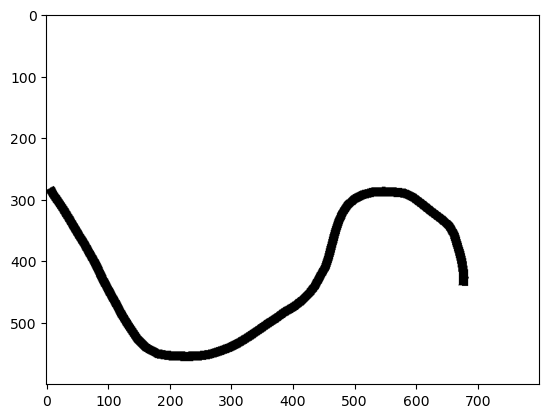

In [175]:
# check image saving by pulling up an example image
plt.imshow(Dict['connect-0F07CDB90B904FB79C385106E46337DE_img5.png'])

# Compare images

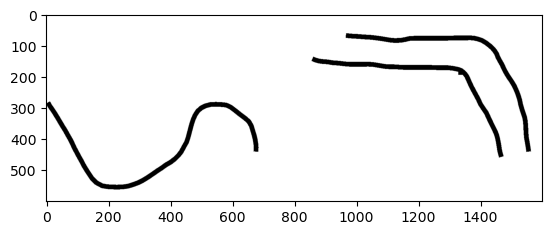

In [180]:
s1 = Dict['connect-0F07CDB90B904FB79C385106E46337DE_img5.png']
s2 = Dict['connect-0F07CDB90B904FB79C385106E46337DE_img9.png']
plt.imshow(np.hstack((s1, s2)))

Text(0.5, 1.0, 'img9')

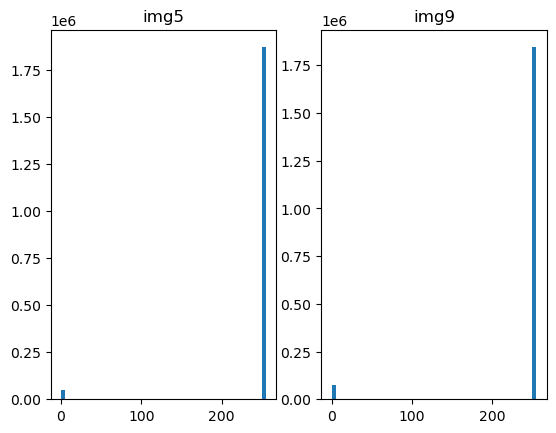

In [185]:
fig, axes = plt.subplots(1, 2)
s1_arr = np.asarray(s1).ravel()
axes[0].hist(s1_arr, bins=50)
axes[0].set_title('img5')
s2_arr = np.asarray(s2).ravel()
axes[1].hist(s2_arr, bins=50)
axes[1].set_title('img9')

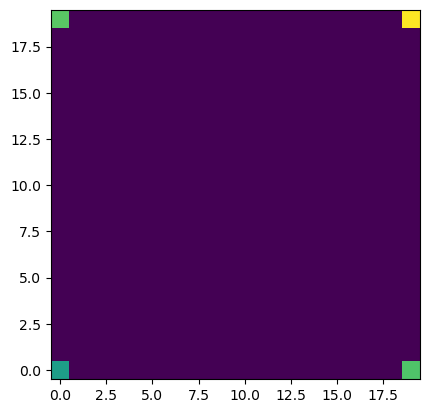

In [207]:
np.corrcoef(s1_arr, s2_arr)[0, 1]

hist_2d, x_edges, y_edges = np.histogram2d(s1_arr,s2_arr,bins=20)
# plt.imshow(hist_2d.T, origin='lower')
hist_2d_log = np.zeros(hist_2d.shape)
non_zeros = hist_2d != 0
hist_2d_log[non_zeros] = np.log(hist_2d[non_zeros])
plt.imshow(hist_2d_log.T, origin='lower')

## Test mutual information with full colored image

Text(0.5, 1.0, 'img6')

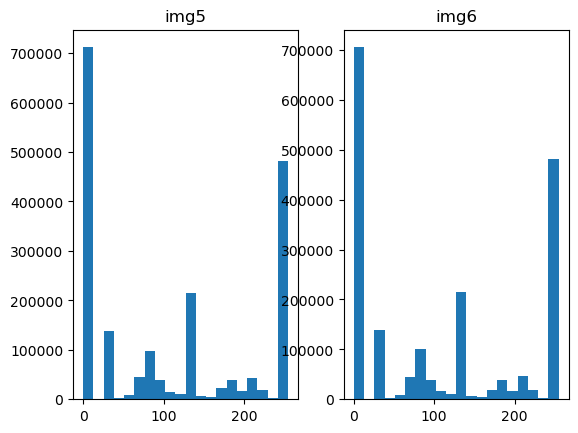

In [152]:
img1 = Image.open("../../game/data/img/pilot1/connect-0F07CDB90B904FB79C385106E46337DE/connect-0F07CDB90B904FB79C385106E46337DE_img5.png")
img2 = Image.open("../../game/data/img/pilot1/connect-0F07CDB90B904FB79C385106E46337DE/connect-0F07CDB90B904FB79C385106E46337DE_img6.png")

fig, axes = plt.subplots(1, 2)
axes[0].hist(np.asarray(img1).ravel(), bins=20)
axes[0].set_title('img5')
axes[1].hist(np.asarray(img2).ravel(), bins=20)
axes[1].set_title('img6')

0.9654034814891289

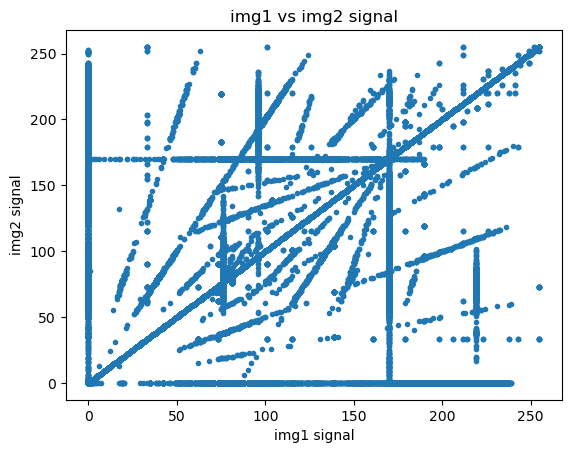

In [156]:
plt.plot(np.asarray(img1).ravel(), np.asarray(img2).ravel(), '.')
plt.xlabel('img1 signal')
plt.ylabel('img2 signal')
plt.title('img1 vs img2 signal')
np.corrcoef(np.asarray(img1).ravel(), np.asarray(img2).ravel())[0, 1]

# Measure mutual information

In [195]:
def mutual_information(hgram):
    # Mutual information for joint histogram
    # Convert bins counts to probability values
    pxy = hgram / float(np.sum(hgram))
    px = np.sum(pxy, axis=1) # marginal for x over y
    py = np.sum(pxy, axis=0) # marginal for y over x
    px_py = px[:, None] * py[None, :] # Broadcast to multiply marginals
    # Now we can do the calculation using the pxy, px_py 2D arrays
    nzs = pxy > 0 # Only non-zero pxy values contribute to the sum
    return np.sum(pxy[nzs] * np.log(pxy[nzs] / px_py[nzs]))

In [239]:
def compareImgs(img1, img2):
    s1 = Dict[img1]
    s2 = Dict[img2]
#     plt.imshow(np.hstack((s1, s2)))
    s1_arr = np.asarray(s1).ravel()
    s2_arr = np.asarray(s2).ravel()
    hist_2d, x_edges, y_edges = np.histogram2d(s1_arr,s2_arr,bins=20)
    return mutual_information(hist_2d)

## Test mutual information across within participant images

In [240]:
print(compareImgs('connect-0F07CDB90B904FB79C385106E46337DE_img3.png', 'connect-0F07CDB90B904FB79C385106E46337DE_img6.png'))

4.387113103632102e-06


In [277]:
samplemidf = pd.DataFrame()
data_list = []
axis_imgs = []
subjdf = df[df['imageID'].str.contains('connect-0F07CDB90B904FB79C385106E46337DE')]['imageID']
for a in subjdf[0:10]:
    axis_imgs.append(Dict[a])
    for b in subjdf[0:10]:
        row = {'imgA': a, 'imgB': b, 'mutualinfo': compareImgs(a, b)}
        data_list.append(row) 

samplemidf = pd.DataFrame(data_list)

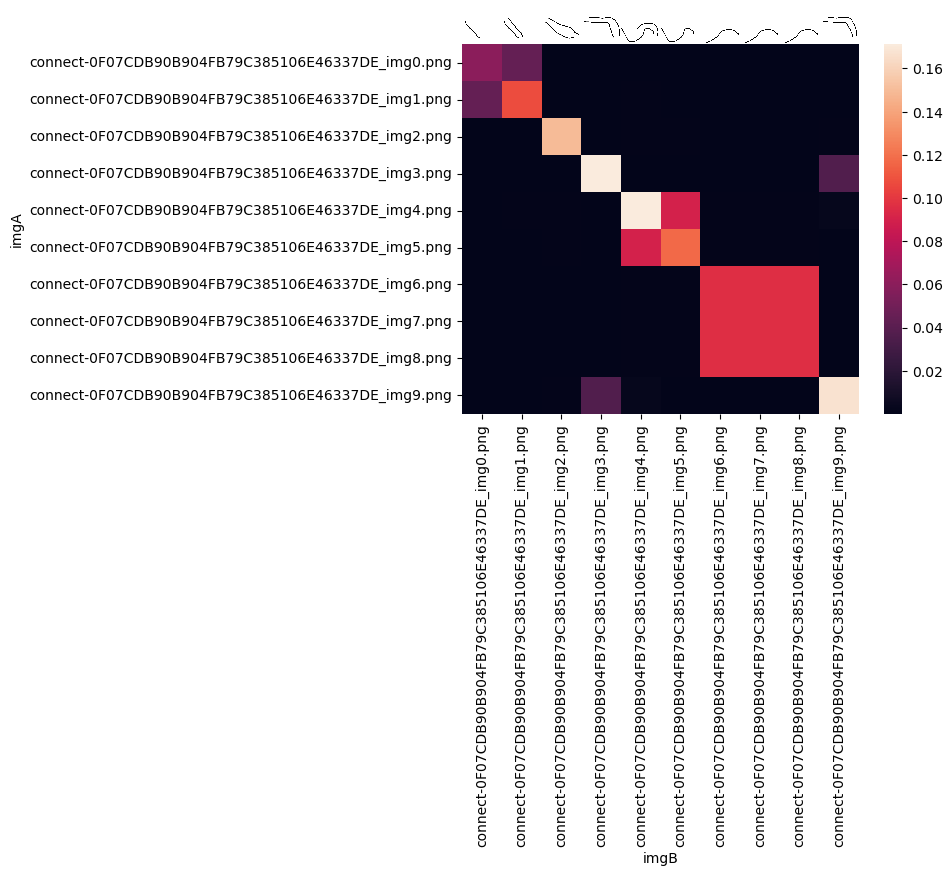

In [278]:
infodf = samplemidf.pivot(index="imgA", columns="imgB", values="mutualinfo")
ax = sns.heatmap(infodf)

tick_labels = ax.xaxis.get_ticklabels()

for i,im in enumerate(axis_imgs):
    ib = OffsetImage(im, zoom=.035)
    ib.image.axes = ax
    ab = AnnotationBbox(ib,
                    tick_labels[i].get_position(),
                    frameon=False,
                    box_alignment=(0.5, 0)
                    )
    ax.add_artist(ab)

## Calculate average image

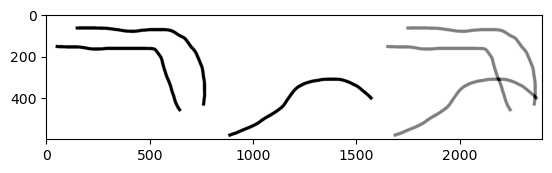

In [335]:
# average of 2 images
s1 = Dict['connect-0F07CDB90B904FB79C385106E46337DE_img3.png']
s2 = Dict['connect-0F07CDB90B904FB79C385106E46337DE_img6.png']
s1_arr = np.array(s1)
s2_arr = np.array(s2)
avg_arr = np.mean(np.array([s1_arr, s2_arr]), axis=0)
result_img = Image.fromarray(avg_arr.astype(np.uint8))
plt.imshow(np.hstack((s1, s2, result_img)))

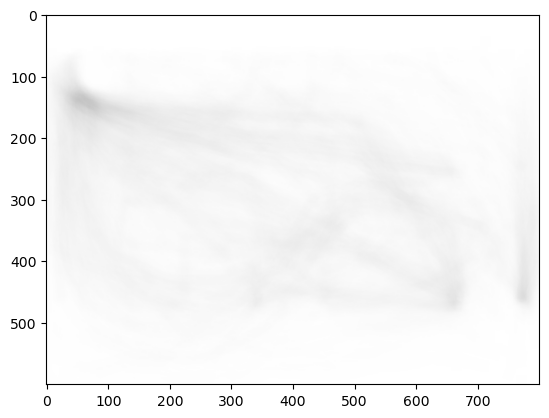

In [376]:
# average of all images
img_arrs = []
for d in Dict:
    img_arr = np.array(Dict[d])
    img_arrs.append(img_arr)

avg_arr = np.mean(np.array(img_arrs), axis=0)
result_img = Image.fromarray(avg_arr.astype(np.uint8))
plt.imshow(result_img)
result_img.save("fig/strokes/avgStroke.png")

basic_far


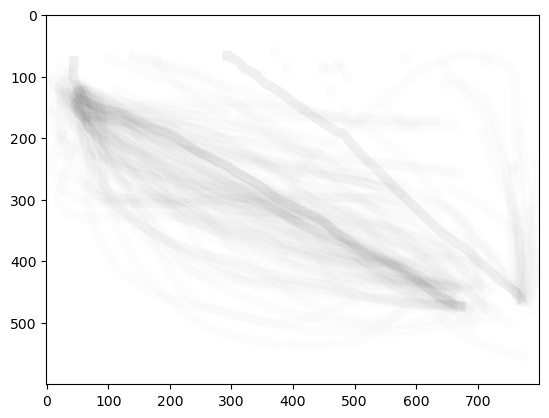

boomerang_left


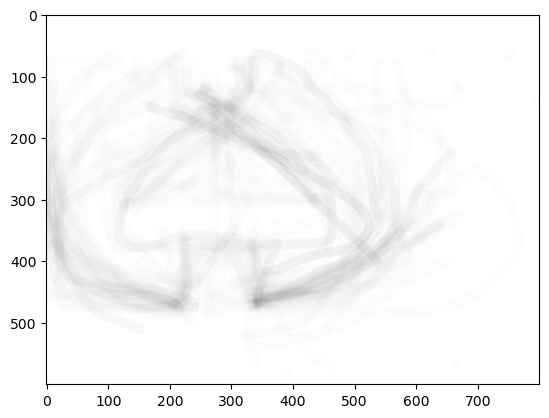

diagonal_descent


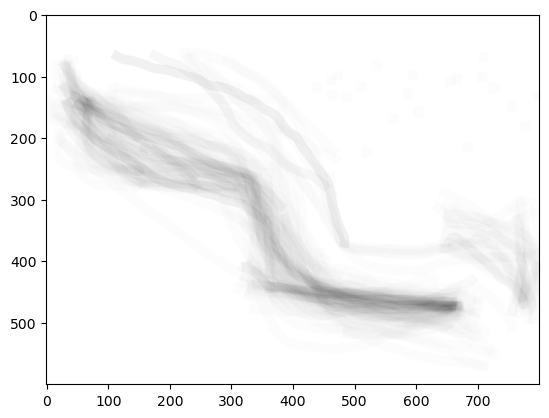

basic_flat


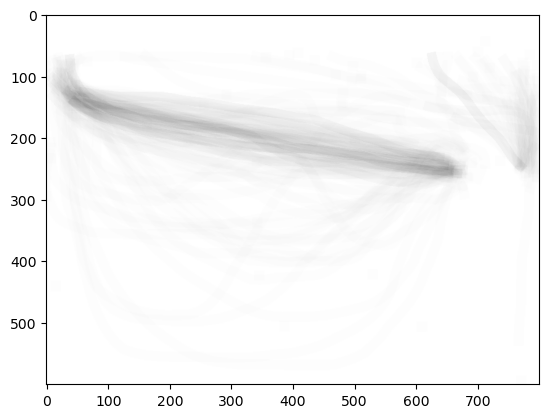

basic_short


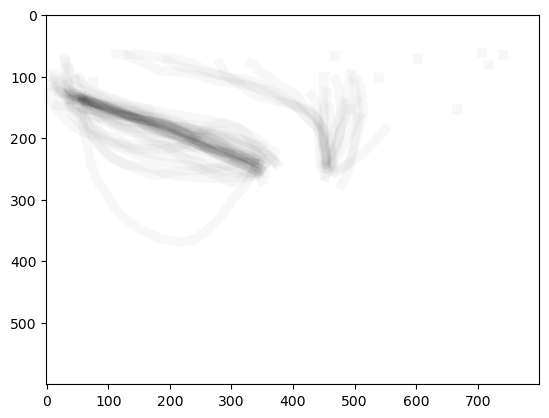

tunnel_wide


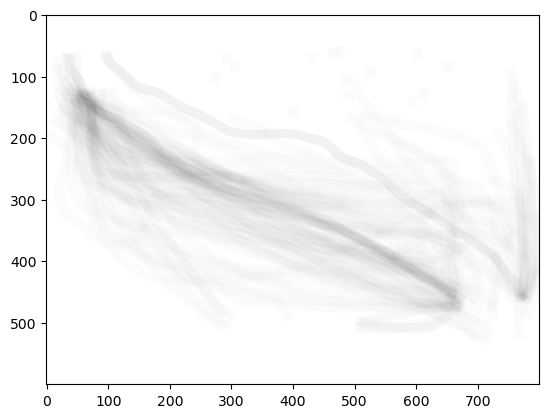

block_long


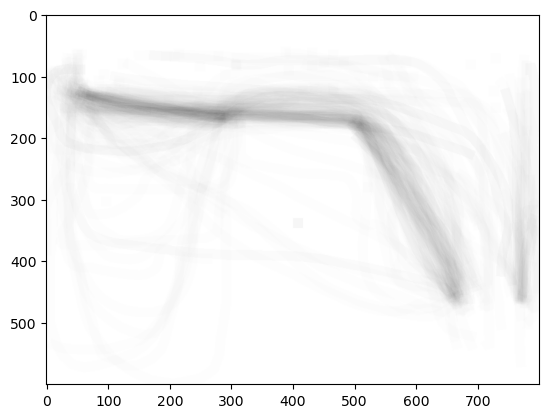

diagonal_ascent


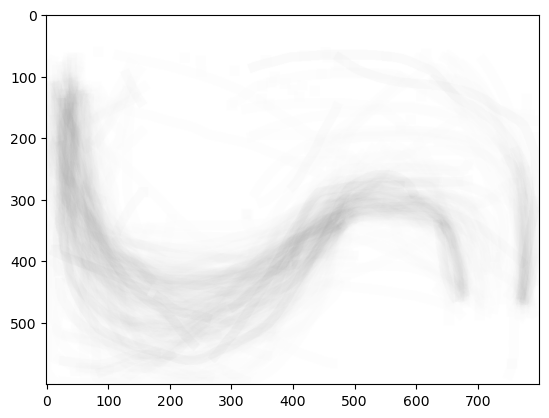

boomerang_middle


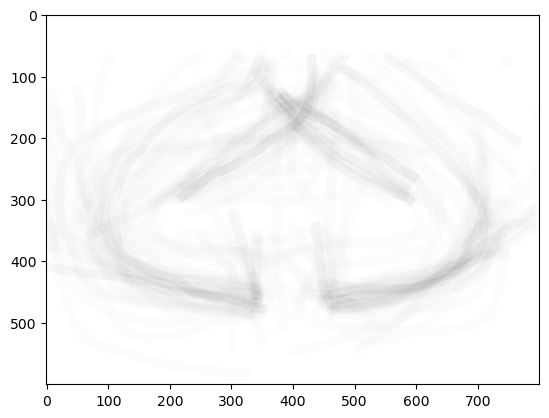

tunnel_narrow


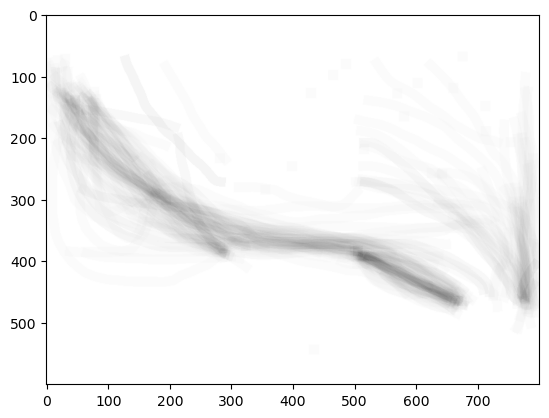

basic_drop


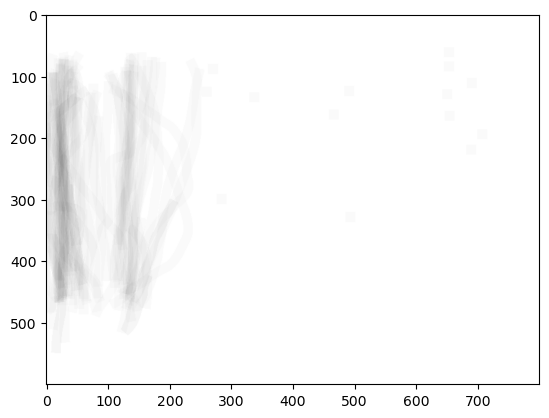

contain_corner


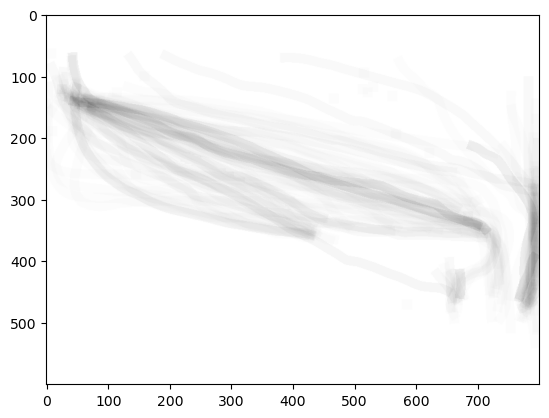

block_med


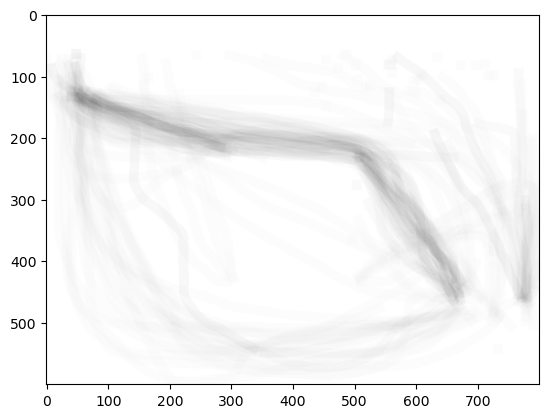

basic_steep


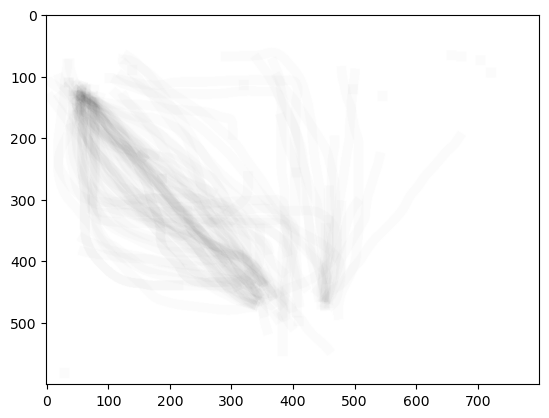

In [486]:
avgLevel = {}

for levelLabel in df['levelID'].unique():
    print(levelLabel)
    levelImgs = df[df['levelID'].str.contains(levelLabel)]['imageID']
    img_arrs = []
    for l in levelImgs:
        img_arr = np.array(Dict[l])
        img_arrs.append(img_arr)
    avgLevel[levelLabel] = np.mean(np.array(img_arrs), axis=0)
    result_img = Image.fromarray(avgLevel[levelLabel].astype(np.uint8))
    imgplot = plt.imshow(result_img)
    plt.show()
    result_img.save("fig/strokes/"+levelLabel+".png")

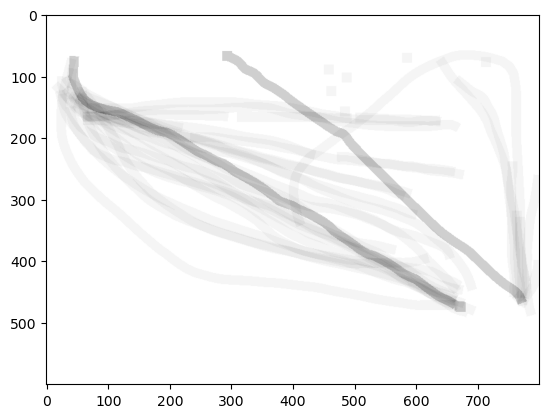

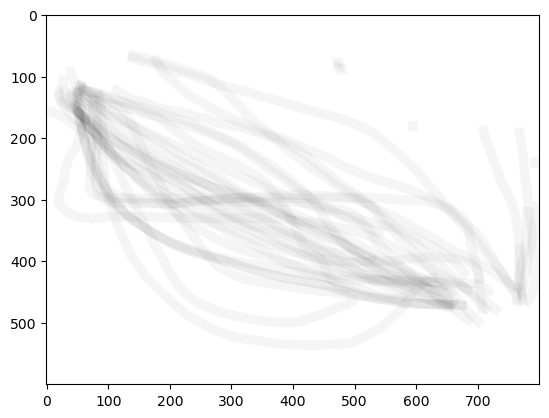

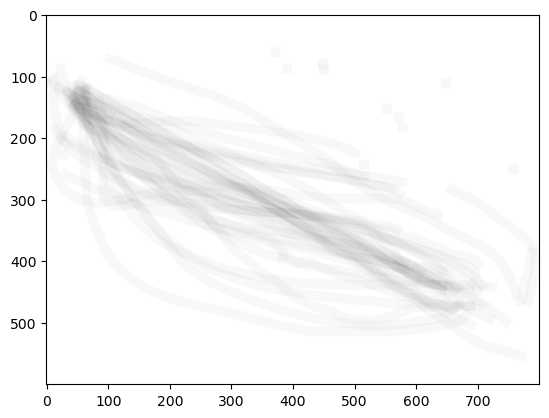

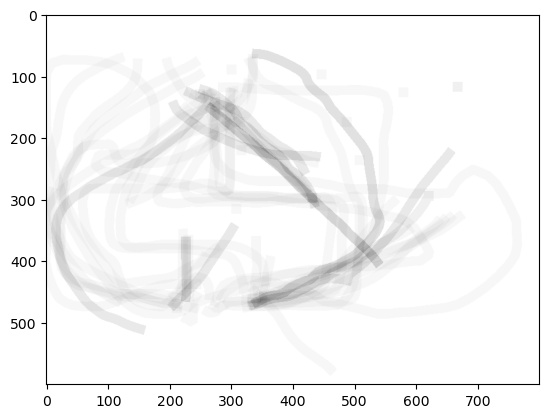

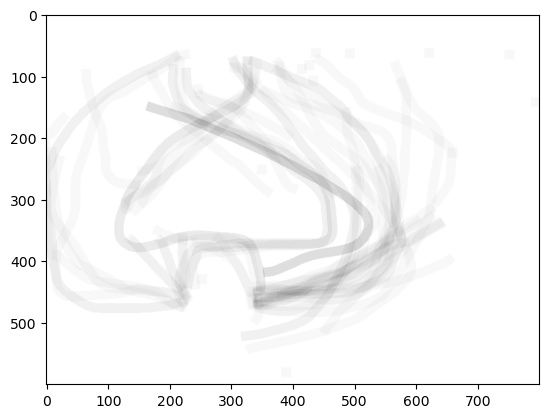

...

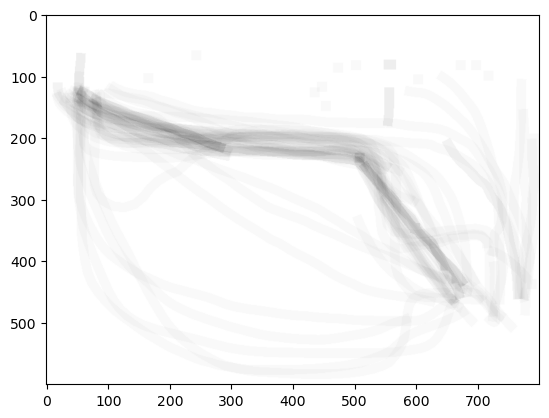

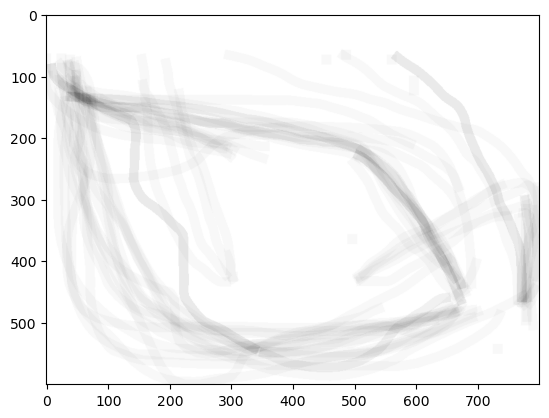

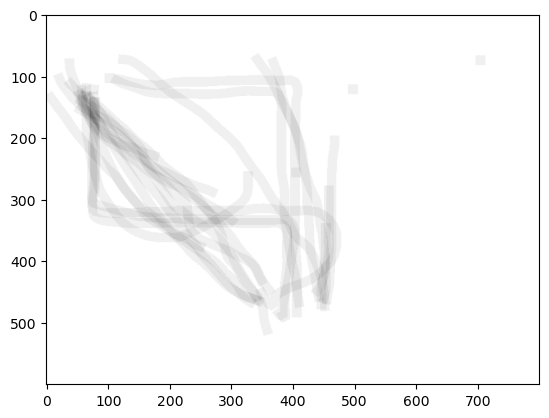

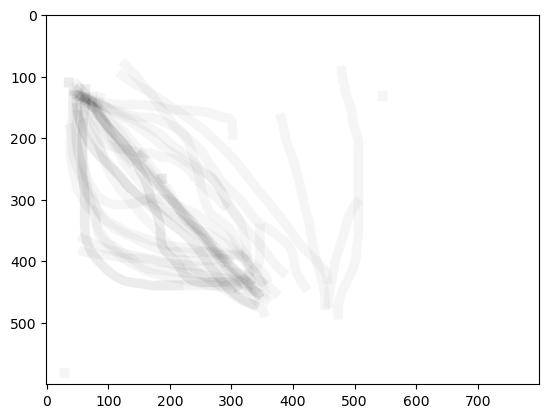

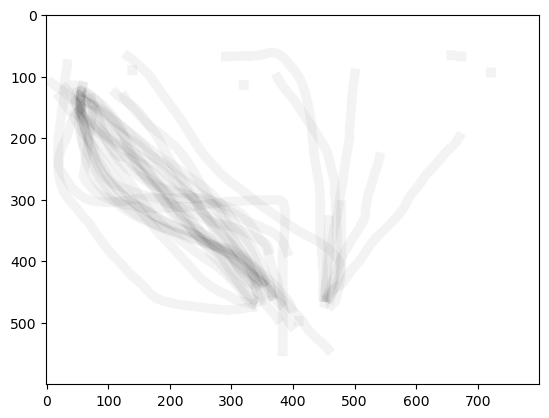

In [476]:
avgLevelCond = {}

for levelLabel in df['levelID'].unique():
#     print(levelLabel)
    for gX in df['gravX'].unique():
        levelIndex = (df['levelID'] == levelLabel) & (df['gravX'] == gX)
        levelImgs = df[levelIndex]['imageID']
        levelCondLabel = levelLabel + '_' + str(gX)
        img_arrs = []
        for l in levelImgs:
            img_arr = np.array(Dict[l])
            img_arrs.append(img_arr)
        avgLevelCond[levelCondLabel] = np.mean(np.array(img_arrs), axis=0)
        result_img = Image.fromarray(avgLevelCond[levelCondLabel].astype(np.uint8))
        imgplot = plt.imshow(result_img)
        plt.show()
        result_img.save("fig/strokes/"+levelCondLabel+".png")

## Calculate mutual information from average images

### mutual information to average overall

In [488]:
all_mi_toAvg = []

for d in Dict:
    if len(df[df['imageID'].str.contains(d)]) > 0: #to match the analysis below (vs level avg)
        s1 = Dict[d]
        s1_arr = np.asarray(s1).ravel()
        s2_arr = avg_arr.ravel()
        hist_2d, x_edges, y_edges = np.histogram2d(s1_arr,s2_arr,bins=20)
        row = {'img': d, 'mutualinfo': mutual_information(hist_2d)}
        all_mi_toAvg.append(row) 

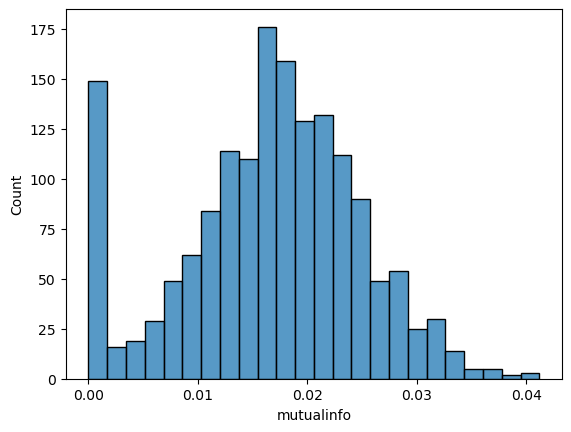

In [508]:
all_mi_toAvg_df = pd.DataFrame(all_mi_toAvg)
aggrFig = sns.histplot(data=all_mi_toAvg_df, x="mutualinfo")
g = aggrFig.get_figure()
g.savefig("fig/mi_aggr.png")

In [514]:
np.mean(all_mi_toAvg_df['mutualinfo'])

6.896432313874571e-05

In [513]:
np.var(all_mi_toAvg_df['mutualinfo'])

0.016560504821371124

### mutual information to average level image

In [493]:
all_mi_toLvl = []

for d in Dict:
    if len(df[df['imageID'].str.contains(d)]) > 0:
        s1 = Dict[d]
        s1_arr = np.asarray(s1).ravel()
        s1_levelID = df[df['imageID'].str.contains(d)]['levelID'].iloc[0]
        s2_arr = avgLevel[s1_levelID].ravel()
        hist_2d, x_edges, y_edges = np.histogram2d(s1_arr,s2_arr,bins=20)
        row = {'img': d, 'level':s1_levelID, 'mutualinfo': mutual_information(hist_2d)}
        all_mi_toLvl.append(row) 

      Unnamed: 0                                    subjID     levelID  gravX  \
1430        1431  connect-F8D52DE7E5634302BB8D6890E6DDBA3F  block_long  -0.25   

      gravY  radius  numAttempts success  \
1430    2.5      30            2    fail   

                                                imageID  \
1430  connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img38...   

                                              directory  
1430  connect-F8D52DE7E5634302BB8D6890E6DDBA3F/conne...  
      Unnamed: 0                                    subjID         levelID  \
1402        1403  connect-F8D52DE7E5634302BB8D6890E6DDBA3F  contain_corner   

      gravX  gravY  radius  numAttempts success  \
1402  -0.25    1.0      30            1    fail   

                                                imageID  \
1402  connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img10...   

                                              directory  
1402  connect-F8D52DE7E5634302BB8D6890E6DDBA3F/conne...  
      Unnamed: 0  

      Unnamed: 0                                    subjID          levelID  \
1398        1399  connect-F8D52DE7E5634302BB8D6890E6DDBA3F  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1398  -0.25    2.5      30            3    fail   

                                                imageID  \
1398  connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img6.png   

                                              directory  
1398  connect-F8D52DE7E5634302BB8D6890E6DDBA3F/conne...  
      Unnamed: 0                                    subjID          levelID  \
1399        1400  connect-F8D52DE7E5634302BB8D6890E6DDBA3F  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1399  -0.25    2.5      30            4    fail   

                                                imageID  \
1399  connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img7.png   

                                              directory  
1399  connect-F8D52DE7E5634302BB8D6890E6DDBA3F/conne...  
      

      Unnamed: 0                                    subjID          levelID  \
1426        1427  connect-F8D52DE7E5634302BB8D6890E6DDBA3F  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1426    0.0    2.5      30            3    fail   

                                                imageID  \
1426  connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img34...   

                                              directory  
1426  connect-F8D52DE7E5634302BB8D6890E6DDBA3F/conne...  
      Unnamed: 0                                    subjID      levelID  \
1412        1413  connect-F8D52DE7E5634302BB8D6890E6DDBA3F  basic_short   

      gravX  gravY  radius  numAttempts  success  \
1412  -0.25    2.5      30            0  success   

                                                imageID  \
1412  connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img20...   

                                              directory  
1412  connect-F8D52DE7E5634302BB8D6890E6DDBA3F/conne...  
      Unname

     Unnamed: 0                                    subjID    levelID  gravX  \
144         145  connect-BDE67C2DF7E34C829465442702DD3ACC  block_med   0.25   

     gravY  radius  numAttempts success  \
144    1.0      20            0    fail   

                                               imageID  \
144  connect-BDE67C2DF7E34C829465442702DD3ACC_img36...   

                                             directory  
144  connect-BDE67C2DF7E34C829465442702DD3ACC/conne...  
     Unnamed: 0                                    subjID           levelID  \
130         131  connect-BDE67C2DF7E34C829465442702DD3ACC  boomerang_middle   

     gravX  gravY  radius  numAttempts  success  \
130  -0.25    1.0      30            2  success   

                                               imageID  \
130  connect-BDE67C2DF7E34C829465442702DD3ACC_img22...   

                                             directory  
130  connect-BDE67C2DF7E34C829465442702DD3ACC/conne...  
     Unnamed: 0               

     Unnamed: 0                                    subjID        levelID  \
110         111  connect-BDE67C2DF7E34C829465442702DD3ACC  tunnel_narrow   

     gravX  gravY  radius  numAttempts success  \
110  -0.25    1.0      20            2    fail   

                                               imageID  \
110  connect-BDE67C2DF7E34C829465442702DD3ACC_img2.png   

                                             directory  
110  connect-BDE67C2DF7E34C829465442702DD3ACC/conne...  
     Unnamed: 0                                    subjID    levelID  gravX  \
148         149  connect-BDE67C2DF7E34C829465442702DD3ACC  block_med   0.25   

     gravY  radius  numAttempts success  \
148    1.0      20            4    fail   

                                               imageID  \
148  connect-BDE67C2DF7E34C829465442702DD3ACC_img40...   

                                             directory  
148  connect-BDE67C2DF7E34C829465442702DD3ACC/conne...  
     Unnamed: 0                       

     Unnamed: 0                                    subjID    levelID  gravX  \
124         125  connect-BDE67C2DF7E34C829465442702DD3ACC  basic_far  -0.25   

     gravY  radius  numAttempts success  \
124    1.0      30            0    fail   

                                               imageID  \
124  connect-BDE67C2DF7E34C829465442702DD3ACC_img16...   

                                             directory  
124  connect-BDE67C2DF7E34C829465442702DD3ACC/conne...  
     Unnamed: 0                                    subjID    levelID  gravX  \
125         126  connect-BDE67C2DF7E34C829465442702DD3ACC  basic_far  -0.25   

     gravY  radius  numAttempts success  \
125    1.0      30            1    fail   

                                               imageID  \
125  connect-BDE67C2DF7E34C829465442702DD3ACC_img17...   

                                             directory  
125  connect-BDE67C2DF7E34C829465442702DD3ACC/conne...  
     Unnamed: 0                               

     Unnamed: 0                                    subjID        levelID  \
419         420  connect-71AEE38C92B24C568F612B9014229FF4  tunnel_narrow   

     gravX  gravY  radius  numAttempts  success  \
419   0.25    2.5      20            0  success   

                                               imageID  \
419  connect-71AEE38C92B24C568F612B9014229FF4_img36...   

                                             directory  
419  connect-71AEE38C92B24C568F612B9014229FF4/conne...  
     Unnamed: 0                                    subjID      levelID  gravX  \
405         406  connect-71AEE38C92B24C568F612B9014229FF4  tunnel_wide    0.0   

     gravY  radius  numAttempts  success  \
405    1.0      20            1  success   

                                               imageID  \
405  connect-71AEE38C92B24C568F612B9014229FF4_img22...   

                                             directory  
405  connect-71AEE38C92B24C568F612B9014229FF4/conne...  
     Unnamed: 0               

     Unnamed: 0                                    subjID      levelID  gravX  \
400         401  connect-71AEE38C92B24C568F612B9014229FF4  basic_steep   0.25   

     gravY  radius  numAttempts  success  \
400    1.0      30            0  success   

                                               imageID  \
400  connect-71AEE38C92B24C568F612B9014229FF4_img17...   

                                             directory  
400  connect-71AEE38C92B24C568F612B9014229FF4/conne...  
     Unnamed: 0                                    subjID    levelID  gravX  \
412         413  connect-71AEE38C92B24C568F612B9014229FF4  block_med    0.0   

     gravY  radius  numAttempts  success  \
412    1.0      20            1  success   

                                               imageID  \
412  connect-71AEE38C92B24C568F612B9014229FF4_img29...   

                                             directory  
412  connect-71AEE38C92B24C568F612B9014229FF4/conne...  
     Unnamed: 0                       

      Unnamed: 0                                    subjID    levelID  gravX  \
1117        1118  connect-EC304583F3AC4B45B6B79A840A0443A0  basic_far   0.25   

      gravY  radius  numAttempts success  \
1117    1.0      20            2    fail   

                                                imageID  \
1117  connect-EC304583F3AC4B45B6B79A840A0443A0_img37...   

                                              directory  
1117  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0                                    subjID    levelID  gravX  \
1116        1117  connect-EC304583F3AC4B45B6B79A840A0443A0  basic_far   0.25   

      gravY  radius  numAttempts success  \
1116    1.0      20            1    fail   

                                                imageID  \
1116  connect-EC304583F3AC4B45B6B79A840A0443A0_img36...   

                                              directory  
1116  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0              

      Unnamed: 0                                    subjID           levelID  \
1175        1176  connect-EC304583F3AC4B45B6B79A840A0443A0  diagonal_descent   

      gravX  gravY  radius  numAttempts success  \
1175   0.25    2.5      30            1    fail   

                                                imageID  \
1175  connect-EC304583F3AC4B45B6B79A840A0443A0_img95...   

                                              directory  
1175  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0                                    subjID    levelID  gravX  \
1122        1123  connect-EC304583F3AC4B45B6B79A840A0443A0  basic_far  -0.25   

      gravY  radius  numAttempts success  \
1122    2.5      30            2    fail   

                                                imageID  \
1122  connect-EC304583F3AC4B45B6B79A840A0443A0_img42...   

                                              directory  
1122  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0

      Unnamed: 0                                    subjID      levelID  \
1166        1167  connect-EC304583F3AC4B45B6B79A840A0443A0  tunnel_wide   

      gravX  gravY  radius  numAttempts success  \
1166   0.25    1.0      20            2    fail   

                                                imageID  \
1166  connect-EC304583F3AC4B45B6B79A840A0443A0_img86...   

                                              directory  
1166  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0                                    subjID           levelID  \
1172        1173  connect-EC304583F3AC4B45B6B79A840A0443A0  diagonal_descent   

      gravX  gravY  radius  numAttempts success  \
1172    0.0    2.5      20            3    fail   

                                                imageID  \
1172  connect-EC304583F3AC4B45B6B79A840A0443A0_img92...   

                                              directory  
1172  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unname

      Unnamed: 0                                    subjID          levelID  \
1082        1083  connect-EC304583F3AC4B45B6B79A840A0443A0  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1082  -0.25    1.0      20            2    fail   

                                                imageID  \
1082  connect-EC304583F3AC4B45B6B79A840A0443A0_img2.png   

                                              directory  
1082  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0                                    subjID          levelID  \
1083        1084  connect-EC304583F3AC4B45B6B79A840A0443A0  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1083  -0.25    1.0      20            3    fail   

                                                imageID  \
1083  connect-EC304583F3AC4B45B6B79A840A0443A0_img3.png   

                                              directory  
1083  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      

      Unnamed: 0                                    subjID         levelID  \
1139        1140  connect-EC304583F3AC4B45B6B79A840A0443A0  boomerang_left   

      gravX  gravY  radius  numAttempts success  \
1139    0.0    2.5      20            4    fail   

                                                imageID  \
1139  connect-EC304583F3AC4B45B6B79A840A0443A0_img59...   

                                              directory  
1139  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0                                    subjID         levelID  \
1151        1152  connect-EC304583F3AC4B45B6B79A840A0443A0  contain_corner   

      gravX  gravY  radius  numAttempts success  \
1151  -0.25    2.5      30            1    fail   

                                                imageID  \
1151  connect-EC304583F3AC4B45B6B79A840A0443A0_img71...   

                                              directory  
1151  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unna

      Unnamed: 0                                    subjID        levelID  \
1090        1091  connect-EC304583F3AC4B45B6B79A840A0443A0  tunnel_narrow   

      gravX  gravY  radius  numAttempts success  \
1090   0.25    2.5      20            0    fail   

                                                imageID  \
1090  connect-EC304583F3AC4B45B6B79A840A0443A0_img10...   

                                              directory  
1090  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0                                    subjID    levelID  gravX  \
1118        1119  connect-EC304583F3AC4B45B6B79A840A0443A0  basic_far   0.25   

      gravY  radius  numAttempts success  \
1118    1.0      20            3    fail   

                                                imageID  \
1118  connect-EC304583F3AC4B45B6B79A840A0443A0_img38...   

                                              directory  
1118  connect-EC304583F3AC4B45B6B79A840A0443A0/conne...  
      Unnamed: 0      

     Unnamed: 0                                    subjID          levelID  \
927         928  connect-1304BAAAAFA04DEE959F8EC00A5E49F6  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
927    0.0    2.5      30            4    fail   

                                               imageID  \
927  connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img21...   

                                             directory  
927  connect-1304BAAAAFA04DEE959F8EC00A5E49F6/conne...  
     Unnamed: 0                                    subjID         levelID  \
941         942  connect-1304BAAAAFA04DEE959F8EC00A5E49F6  contain_corner   

     gravX  gravY  radius  numAttempts success  \
941  -0.25    2.5      30            3    fail   

                                               imageID  \
941  connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img35...   

                                             directory  
941  connect-1304BAAAAFA04DEE959F8EC00A5E49F6/conne...  
     Unnamed: 0         

     Unnamed: 0                                    subjID      levelID  gravX  \
955         956  connect-1304BAAAAFA04DEE959F8EC00A5E49F6  tunnel_wide   0.25   

     gravY  radius  numAttempts  success  \
955    1.0      20            0  success   

                                               imageID  \
955  connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img49...   

                                             directory  
955  connect-1304BAAAAFA04DEE959F8EC00A5E49F6/conne...  
     Unnamed: 0                                    subjID           levelID  \
954         955  connect-1304BAAAAFA04DEE959F8EC00A5E49F6  boomerang_middle   

     gravX  gravY  radius  numAttempts  success  \
954   0.25    1.0      20            1  success   

                                               imageID  \
954  connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img48...   

                                             directory  
954  connect-1304BAAAAFA04DEE959F8EC00A5E49F6/conne...  
     Unnamed: 0         

     Unnamed: 0                                    subjID           levelID  \
912         913  connect-1304BAAAAFA04DEE959F8EC00A5E49F6  boomerang_middle   

     gravX  gravY  radius  numAttempts success  \
912  -0.25    2.5      20            0    fail   

                                               imageID  \
912  connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img6.png   

                                             directory  
912  connect-1304BAAAAFA04DEE959F8EC00A5E49F6/conne...  
     Unnamed: 0                                    subjID    levelID  gravX  \
922         923  connect-1304BAAAAFA04DEE959F8EC00A5E49F6  basic_far    0.0   

     gravY  radius  numAttempts  success  \
922    2.5      20            0  success   

                                               imageID  \
922  connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img16...   

                                             directory  
922  connect-1304BAAAAFA04DEE959F8EC00A5E49F6/conne...  
     Unnamed: 0               

    Unnamed: 0                                    subjID          levelID  \
89          90  connect-DF011FC195104845887434C8E2642FB6  diagonal_ascent   

    gravX  gravY  radius  numAttempts success  \
89  -0.25    2.5      20            3    fail   

                                              imageID  \
89  connect-DF011FC195104845887434C8E2642FB6_img26...   

                                            directory  
89  connect-DF011FC195104845887434C8E2642FB6/conne...  
    Unnamed: 0                                    subjID          levelID  \
95          96  connect-DF011FC195104845887434C8E2642FB6  diagonal_ascent   

    gravX  gravY  radius  numAttempts success  \
95  -0.25    2.5      30            4    fail   

                                              imageID  \
95  connect-DF011FC195104845887434C8E2642FB6_img32...   

                                            directory  
95  connect-DF011FC195104845887434C8E2642FB6/conne...  
    Unnamed: 0                        

     Unnamed: 0                                    subjID           levelID  \
106         107  connect-DF011FC195104845887434C8E2642FB6  diagonal_descent   

     gravX  gravY  radius  numAttempts success  \
106  -0.25    1.0      30            3    fail   

                                               imageID  \
106  connect-DF011FC195104845887434C8E2642FB6_img43...   

                                             directory  
106  connect-DF011FC195104845887434C8E2642FB6/conne...  
    Unnamed: 0                                    subjID     levelID  gravX  \
66          67  connect-DF011FC195104845887434C8E2642FB6  block_long    0.0   

    gravY  radius  numAttempts success  \
66    1.0      20            3    fail   

                                              imageID  \
66  connect-DF011FC195104845887434C8E2642FB6_img3.png   

                                            directory  
66  connect-DF011FC195104845887434C8E2642FB6/conne...  
    Unnamed: 0                        

     Unnamed: 0                                    subjID          levelID  \
337         338  connect-6F75D8B9C091457AB35203CFF4BE2103  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
337  -0.25    1.0      30            2    fail   

                                               imageID  \
337  connect-6F75D8B9C091457AB35203CFF4BE2103_img29...   

                                             directory  
337  connect-6F75D8B9C091457AB35203CFF4BE2103/conne...  
     Unnamed: 0                                    subjID           levelID  \
323         324  connect-6F75D8B9C091457AB35203CFF4BE2103  diagonal_descent   

     gravX  gravY  radius  numAttempts  success  \
323   0.25    1.0      20            0  success   

                                               imageID  \
323  connect-6F75D8B9C091457AB35203CFF4BE2103_img15...   

                                             directory  
323  connect-6F75D8B9C091457AB35203CFF4BE2103/conne...  
     Unnamed: 0   

     Unnamed: 0                                    subjID          levelID  \
369         370  connect-6F75D8B9C091457AB35203CFF4BE2103  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
369  -0.25    1.0      20            1    fail   

                                               imageID  \
369  connect-6F75D8B9C091457AB35203CFF4BE2103_img61...   

                                             directory  
369  connect-6F75D8B9C091457AB35203CFF4BE2103/conne...  
     Unnamed: 0                                    subjID          levelID  \
371         372  connect-6F75D8B9C091457AB35203CFF4BE2103  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
371  -0.25    1.0      20            3    fail   

                                               imageID  \
371  connect-6F75D8B9C091457AB35203CFF4BE2103_img63...   

                                             directory  
371  connect-6F75D8B9C091457AB35203CFF4BE2103/conne...  
     Unnamed: 0       

     Unnamed: 0                                    subjID     levelID  gravX  \
315         316  connect-6F75D8B9C091457AB35203CFF4BE2103  basic_flat  -0.25   

     gravY  radius  numAttempts success  \
315    2.5      20            2    fail   

                                               imageID  \
315  connect-6F75D8B9C091457AB35203CFF4BE2103_img7.png   

                                             directory  
315  connect-6F75D8B9C091457AB35203CFF4BE2103/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
314         315  connect-6F75D8B9C091457AB35203CFF4BE2103  basic_flat  -0.25   

     gravY  radius  numAttempts success  \
314    2.5      20            1    fail   

                                               imageID  \
314  connect-6F75D8B9C091457AB35203CFF4BE2103_img6.png   

                                             directory  
314  connect-6F75D8B9C091457AB35203CFF4BE2103/conne...  
     Unnamed: 0                           

     Unnamed: 0                                    subjID          levelID  \
335         336  connect-6F75D8B9C091457AB35203CFF4BE2103  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
335  -0.25    1.0      30            0    fail   

                                               imageID  \
335  connect-6F75D8B9C091457AB35203CFF4BE2103_img27...   

                                             directory  
335  connect-6F75D8B9C091457AB35203CFF4BE2103/conne...  
     Unnamed: 0                                    subjID      levelID  gravX  \
334         335  connect-6F75D8B9C091457AB35203CFF4BE2103  basic_steep    0.0   

     gravY  radius  numAttempts  success  \
334    2.5      30            0  success   

                                               imageID  \
334  connect-6F75D8B9C091457AB35203CFF4BE2103_img26...   

                                             directory  
334  connect-6F75D8B9C091457AB35203CFF4BE2103/conne...  
     Unnamed: 0             

     Unnamed: 0                                    subjID      levelID  gravX  \
191         192  connect-A4CF186F80ED41E6973870DB4C597F32  tunnel_wide    0.0   

     gravY  radius  numAttempts success  \
191    2.5      30            0    fail   

                                               imageID  \
191  connect-A4CF186F80ED41E6973870DB4C597F32_img29...   

                                             directory  
191  connect-A4CF186F80ED41E6973870DB4C597F32/conne...  
     Unnamed: 0                                    subjID      levelID  gravX  \
190         191  connect-A4CF186F80ED41E6973870DB4C597F32  basic_steep  -0.25   

     gravY  radius  numAttempts  success  \
190    1.0      30            0  success   

                                               imageID  \
190  connect-A4CF186F80ED41E6973870DB4C597F32_img28...   

                                             directory  
190  connect-A4CF186F80ED41E6973870DB4C597F32/conne...  
     Unnamed: 0                     

     Unnamed: 0                                    subjID      levelID  gravX  \
180         181  connect-A4CF186F80ED41E6973870DB4C597F32  basic_short  -0.25   

     gravY  radius  numAttempts  success  \
180    2.5      30            0  success   

                                               imageID  \
180  connect-A4CF186F80ED41E6973870DB4C597F32_img18...   

                                             directory  
180  connect-A4CF186F80ED41E6973870DB4C597F32/conne...  
     Unnamed: 0                                    subjID           levelID  \
188         189  connect-A4CF186F80ED41E6973870DB4C597F32  boomerang_middle   

     gravX  gravY  radius  numAttempts success  \
188    0.0    1.0      20            3    fail   

                                               imageID  \
188  connect-A4CF186F80ED41E6973870DB4C597F32_img26...   

                                             directory  
188  connect-A4CF186F80ED41E6973870DB4C597F32/conne...  
     Unnamed: 0           

      Unnamed: 0                                    subjID         levelID  \
1229        1230  connect-5F8C795604094A3CB7FDE1F1A3955387  contain_corner   

      gravX  gravY  radius  numAttempts  success  \
1229    0.0    1.0      30            4  success   

                                                imageID  \
1229  connect-5F8C795604094A3CB7FDE1F1A3955387_img5.png   

                                              directory  
1229  connect-5F8C795604094A3CB7FDE1F1A3955387/conne...  
      Unnamed: 0                                    subjID         levelID  \
1225        1226  connect-5F8C795604094A3CB7FDE1F1A3955387  contain_corner   

      gravX  gravY  radius  numAttempts success  \
1225    0.0    1.0      30            0    fail   

                                                imageID  \
1225  connect-5F8C795604094A3CB7FDE1F1A3955387_img1.png   

                                              directory  
1225  connect-5F8C795604094A3CB7FDE1F1A3955387/conne...  
      Un

      Unnamed: 0                                    subjID          levelID  \
1264        1265  connect-5F8C795604094A3CB7FDE1F1A3955387  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1264    0.0    2.5      30            0    fail   

                                                imageID  \
1264  connect-5F8C795604094A3CB7FDE1F1A3955387_img40...   

                                              directory  
1264  connect-5F8C795604094A3CB7FDE1F1A3955387/conne...  
      Unnamed: 0                                    subjID          levelID  \
1257        1258  connect-5F8C795604094A3CB7FDE1F1A3955387  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1257   0.25    1.0      30            2    fail   

                                                imageID  \
1257  connect-5F8C795604094A3CB7FDE1F1A3955387_img33...   

                                              directory  
1257  connect-5F8C795604094A3CB7FDE1F1A3955387/conne...  
      

      Unnamed: 0                                    subjID     levelID  gravX  \
1260        1261  connect-5F8C795604094A3CB7FDE1F1A3955387  basic_drop  -0.25   

      gravY  radius  numAttempts  success  \
1260    2.5      30            0  success   

                                                imageID  \
1260  connect-5F8C795604094A3CB7FDE1F1A3955387_img36...   

                                              directory  
1260  connect-5F8C795604094A3CB7FDE1F1A3955387/conne...  
      Unnamed: 0                                    subjID          levelID  \
1246        1247  connect-5F8C795604094A3CB7FDE1F1A3955387  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1246  -0.25    2.5      20            0    fail   

                                                imageID  \
1246  connect-5F8C795604094A3CB7FDE1F1A3955387_img22...   

                                              directory  
1246  connect-5F8C795604094A3CB7FDE1F1A3955387/conne...  
      Unnamed:

     Unnamed: 0                                    subjID          levelID  \
753         754  connect-35C167A8A69C44C6901146BCBDA40868  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
753   0.25    1.0      20            1    fail   

                                               imageID  \
753  connect-35C167A8A69C44C6901146BCBDA40868_img33...   

                                             directory  
753  connect-35C167A8A69C44C6901146BCBDA40868/conne...  
     Unnamed: 0                                    subjID           levelID  \
747         748  connect-35C167A8A69C44C6901146BCBDA40868  boomerang_middle   

     gravX  gravY  radius  numAttempts success  \
747   0.25    1.0      20            1    fail   

                                               imageID  \
747  connect-35C167A8A69C44C6901146BCBDA40868_img27...   

                                             directory  
747  connect-35C167A8A69C44C6901146BCBDA40868/conne...  
     Unnamed: 0     

     Unnamed: 0                                    subjID           levelID  \
743         744  connect-35C167A8A69C44C6901146BCBDA40868  boomerang_middle   

     gravX  gravY  radius  numAttempts success  \
743    0.0    1.0      20            2    fail   

                                               imageID  \
743  connect-35C167A8A69C44C6901146BCBDA40868_img23...   

                                             directory  
743  connect-35C167A8A69C44C6901146BCBDA40868/conne...  
     Unnamed: 0                                    subjID          levelID  \
757         758  connect-35C167A8A69C44C6901146BCBDA40868  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
757   0.25    1.0      30            0    fail   

                                               imageID  \
757  connect-35C167A8A69C44C6901146BCBDA40868_img37...   

                                             directory  
757  connect-35C167A8A69C44C6901146BCBDA40868/conne...  
     Unnamed: 0     

     Unnamed: 0                                    subjID    levelID  gravX  \
735         736  connect-35C167A8A69C44C6901146BCBDA40868  block_med   0.25   

     gravY  radius  numAttempts success  \
735    1.0      20            2    fail   

                                               imageID  \
735  connect-35C167A8A69C44C6901146BCBDA40868_img15...   

                                             directory  
735  connect-35C167A8A69C44C6901146BCBDA40868/conne...  
     Unnamed: 0                                    subjID    levelID  gravX  \
737         738  connect-35C167A8A69C44C6901146BCBDA40868  block_med    0.0   

     gravY  radius  numAttempts success  \
737    2.5      20            0    fail   

                                               imageID  \
737  connect-35C167A8A69C44C6901146BCBDA40868_img17...   

                                             directory  
737  connect-35C167A8A69C44C6901146BCBDA40868/conne...  
     Unnamed: 0                               

    Unnamed: 0                                    subjID    levelID  gravX  \
27          28  connect-1DF28D04D4BC4AD0A9B59DD0E935393A  basic_far  -0.25   

    gravY  radius  numAttempts success  \
27    2.5      20            4    fail   

                                              imageID  \
27  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img27...   

                                            directory  
27  connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...  
    Unnamed: 0                                    subjID     levelID  gravX  \
33          34  connect-1DF28D04D4BC4AD0A9B59DD0E935393A  block_long    0.0   

    gravY  radius  numAttempts success  \
33    2.5      20            0    fail   

                                              imageID  \
33  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img33...   

                                            directory  
33  connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...  
    Unnamed: 0                                    subjID    

   Unnamed: 0                                    subjID    levelID  gravX  \
2           3  connect-1DF28D04D4BC4AD0A9B59DD0E935393A  basic_far    0.0   

   gravY  radius  numAttempts  success  \
2    2.5      20            2  success   

                                             imageID  \
2  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img2.png   

                                           directory  
2  connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...  
    Unnamed: 0                                    subjID          levelID  \
44          45  connect-1DF28D04D4BC4AD0A9B59DD0E935393A  diagonal_ascent   

    gravX  gravY  radius  numAttempts success  \
44   0.25    1.0      20            2    fail   

                                              imageID  \
44  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img44...   

                                            directory  
44  connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...  
    Unnamed: 0                                    subjID

   Unnamed: 0                                    subjID           levelID  \
8           9  connect-1DF28D04D4BC4AD0A9B59DD0E935393A  diagonal_descent   

   gravX  gravY  radius  numAttempts success  \
8   0.25    1.0      30            0    fail   

                                             imageID  \
8  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img8.png   

                                           directory  
8  connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...  
   Unnamed: 0                                    subjID           levelID  \
9          10  connect-1DF28D04D4BC4AD0A9B59DD0E935393A  diagonal_descent   

   gravX  gravY  radius  numAttempts success  \
9   0.25    1.0      30            1    fail   

                                             imageID  \
9  connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img9.png   

                                           directory  
9  connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...  
    Unnamed: 0                                    

      Unnamed: 0                                    subjID           levelID  \
1436        1437  connect-AF702843D08345DDB622016021A53AD9  diagonal_descent   

      gravX  gravY  radius  numAttempts  success  \
1436    0.0    2.5      30            1  success   

                                                imageID  \
1436  connect-AF702843D08345DDB622016021A53AD9_img3.png   

                                              directory  
1436  connect-AF702843D08345DDB622016021A53AD9/conne...  
      Unnamed: 0                                    subjID      levelID  \
1446        1447  connect-AF702843D08345DDB622016021A53AD9  tunnel_wide   

      gravX  gravY  radius  numAttempts success  \
1446   0.25    2.5      20            0    fail   

                                                imageID  \
1446  connect-AF702843D08345DDB622016021A53AD9_img13...   

                                              directory  
1446  connect-AF702843D08345DDB622016021A53AD9/conne...  
      Unna

      Unnamed: 0                                    subjID         levelID  \
1476        1477  connect-AF702843D08345DDB622016021A53AD9  boomerang_left   

      gravX  gravY  radius  numAttempts  success  \
1476   0.25    1.0      30            0  success   

                                                imageID  \
1476  connect-AF702843D08345DDB622016021A53AD9_img43...   

                                              directory  
1476  connect-AF702843D08345DDB622016021A53AD9/conne...  
      Unnamed: 0                                    subjID           levelID  \
1474        1475  connect-AF702843D08345DDB622016021A53AD9  diagonal_descent   

      gravX  gravY  radius  numAttempts success  \
1474  -0.25    2.5      30            1    fail   

                                                imageID  \
1474  connect-AF702843D08345DDB622016021A53AD9_img41...   

                                              directory  
1474  connect-AF702843D08345DDB622016021A53AD9/conne...  
    

      Unnamed: 0                                    subjID        levelID  \
1467        1468  connect-AF702843D08345DDB622016021A53AD9  tunnel_narrow   

      gravX  gravY  radius  numAttempts success  \
1467  -0.25    1.0      30            1    fail   

                                                imageID  \
1467  connect-AF702843D08345DDB622016021A53AD9_img34...   

                                              directory  
1467  connect-AF702843D08345DDB622016021A53AD9/conne...  
      Unnamed: 0                                    subjID      levelID  \
1455        1456  connect-AF702843D08345DDB622016021A53AD9  tunnel_wide   

      gravX  gravY  radius  numAttempts success  \
1455    0.0    1.0      30            1    fail   

                                                imageID  \
1455  connect-AF702843D08345DDB622016021A53AD9_img22...   

                                              directory  
1455  connect-AF702843D08345DDB622016021A53AD9/conne...  
      Unnamed: 0  

     Unnamed: 0                                    subjID      levelID  gravX  \
512         513  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D  tunnel_wide   0.25   

     gravY  radius  numAttempts  success  \
512    2.5      30            0  success   

                                               imageID  \
512  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img20...   

                                             directory  
512  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
513         514  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D  basic_flat   0.25   

     gravY  radius  numAttempts  success  \
513    2.5      30            0  success   

                                               imageID  \
513  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img21...   

                                             directory  
513  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D/conne...  
     Unnamed: 0                     

     Unnamed: 0                                    subjID           levelID  \
548         549  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D  diagonal_descent   

     gravX  gravY  radius  numAttempts success  \
548  -0.25    1.0      30            0    fail   

                                               imageID  \
548  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img56...   

                                             directory  
548  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D/conne...  
     Unnamed: 0                                    subjID    levelID  gravX  \
532         533  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D  basic_far    0.0   

     gravY  radius  numAttempts success  \
532    2.5      20            2    fail   

                                               imageID  \
532  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img40...   

                                             directory  
532  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D/conne...  
     Unnamed: 0                 

     Unnamed: 0                                    subjID    levelID  gravX  \
495         496  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D  block_med    0.0   

     gravY  radius  numAttempts success  \
495    2.5      20            3    fail   

                                               imageID  \
495  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img3.png   

                                             directory  
495  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D/conne...  
     Unnamed: 0                                    subjID         levelID  \
504         505  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D  contain_corner   

     gravX  gravY  radius  numAttempts success  \
504    0.0    1.0      20            2    fail   

                                               imageID  \
504  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img12...   

                                             directory  
504  connect-AD5993CF4D3C4DCC8A62F2D5EE70755D/conne...  
     Unnamed: 0                     

     Unnamed: 0                                    subjID          levelID  \
701         702  connect-1501C5CE8BBE4B789CD17DD9FDB6A737  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
701    0.0    1.0      20            1    fail   

                                               imageID  \
701  connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img45...   

                                             directory  
701  connect-1501C5CE8BBE4B789CD17DD9FDB6A737/conne...  
     Unnamed: 0                                    subjID    levelID  gravX  \
707         708  connect-1501C5CE8BBE4B789CD17DD9FDB6A737  block_med    0.0   

     gravY  radius  numAttempts  success  \
707    2.5      30            2  success   

                                               imageID  \
707  connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img51...   

                                             directory  
707  connect-1501C5CE8BBE4B789CD17DD9FDB6A737/conne...  
     Unnamed: 0                 

     Unnamed: 0                                    subjID     levelID  gravX  \
688         689  connect-1501C5CE8BBE4B789CD17DD9FDB6A737  block_long  -0.25   

     gravY  radius  numAttempts success  \
688    2.5      30            3    fail   

                                               imageID  \
688  connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img32...   

                                             directory  
688  connect-1501C5CE8BBE4B789CD17DD9FDB6A737/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
689         690  connect-1501C5CE8BBE4B789CD17DD9FDB6A737  block_long  -0.25   

     gravY  radius  numAttempts success  \
689    2.5      30            4    fail   

                                               imageID  \
689  connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img33...   

                                             directory  
689  connect-1501C5CE8BBE4B789CD17DD9FDB6A737/conne...  
     Unnamed: 0                           

     Unnamed: 0                                    subjID      levelID  gravX  \
679         680  connect-1501C5CE8BBE4B789CD17DD9FDB6A737  basic_steep   0.25   

     gravY  radius  numAttempts  success  \
679    1.0      30            0  success   

                                               imageID  \
679  connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img23...   

                                             directory  
679  connect-1501C5CE8BBE4B789CD17DD9FDB6A737/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
663         664  connect-1501C5CE8BBE4B789CD17DD9FDB6A737  block_long  -0.25   

     gravY  radius  numAttempts success  \
663    1.0      20            2    fail   

                                               imageID  \
663  connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img7.png   

                                             directory  
663  connect-1501C5CE8BBE4B789CD17DD9FDB6A737/conne...  
     Unnamed: 0                       

     Unnamed: 0                                    subjID         levelID  \
672         673  connect-1501C5CE8BBE4B789CD17DD9FDB6A737  contain_corner   

     gravX  gravY  radius  numAttempts success  \
672  -0.25    2.5      30            1    fail   

                                               imageID  \
672  connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img16...   

                                             directory  
672  connect-1501C5CE8BBE4B789CD17DD9FDB6A737/conne...  
     Unnamed: 0                                    subjID         levelID  \
673         674  connect-1501C5CE8BBE4B789CD17DD9FDB6A737  contain_corner   

     gravX  gravY  radius  numAttempts  success  \
673  -0.25    2.5      30            2  success   

                                               imageID  \
673  connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img17...   

                                             directory  
673  connect-1501C5CE8BBE4B789CD17DD9FDB6A737/conne...  
     Unnamed: 0         

      Unnamed: 0                                    subjID         levelID  \
1194        1195  connect-C809D394C2CD4B3296F6F24D523DE626  boomerang_left   

      gravX  gravY  radius  numAttempts success  \
1194  -0.25    2.5      30            0    fail   

                                                imageID  \
1194  connect-C809D394C2CD4B3296F6F24D523DE626_img15...   

                                              directory  
1194  connect-C809D394C2CD4B3296F6F24D523DE626/conne...  
      Unnamed: 0                                    subjID      levelID  \
1208        1209  connect-C809D394C2CD4B3296F6F24D523DE626  basic_steep   

      gravX  gravY  radius  numAttempts  success  \
1208   0.25    2.5      20            0  success   

                                                imageID  \
1208  connect-C809D394C2CD4B3296F6F24D523DE626_img29...   

                                              directory  
1208  connect-C809D394C2CD4B3296F6F24D523DE626/conne...  
      Unnamed:

      Unnamed: 0                                    subjID      levelID  \
1221        1222  connect-C809D394C2CD4B3296F6F24D523DE626  basic_short   

      gravX  gravY  radius  numAttempts  success  \
1221    0.0    1.0      30            0  success   

                                                imageID  \
1221  connect-C809D394C2CD4B3296F6F24D523DE626_img42...   

                                              directory  
1221  connect-C809D394C2CD4B3296F6F24D523DE626/conne...  
      Unnamed: 0                                    subjID     levelID  gravX  \
1180        1181  connect-C809D394C2CD4B3296F6F24D523DE626  block_long  -0.25   

      gravY  radius  numAttempts success  \
1180    2.5      30            1    fail   

                                                imageID  \
1180  connect-C809D394C2CD4B3296F6F24D523DE626_img1.png   

                                              directory  
1180  connect-C809D394C2CD4B3296F6F24D523DE626/conne...  
      Unnamed: 0      

      Unnamed: 0                                    subjID        levelID  \
1200        1201  connect-C809D394C2CD4B3296F6F24D523DE626  tunnel_narrow   

      gravX  gravY  radius  numAttempts success  \
1200  -0.25    1.0      30            2    fail   

                                                imageID  \
1200  connect-C809D394C2CD4B3296F6F24D523DE626_img21...   

                                              directory  
1200  connect-C809D394C2CD4B3296F6F24D523DE626/conne...  
      Unnamed: 0                                    subjID          levelID  \
1214        1215  connect-C809D394C2CD4B3296F6F24D523DE626  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1214   0.25    2.5      30            0    fail   

                                                imageID  \
1214  connect-C809D394C2CD4B3296F6F24D523DE626_img35...   

                                              directory  
1214  connect-C809D394C2CD4B3296F6F24D523DE626/conne...  
     Unnam

     Unnamed: 0                                    subjID    levelID  gravX  \
580         581  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590  block_med  -0.25   

     gravY  radius  numAttempts success  \
580    1.0      30            3    fail   

                                               imageID  \
580  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590_img21...   

                                             directory  
580  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
594         595  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590  block_long   0.25   

     gravY  radius  numAttempts  success  \
594    1.0      20            1  success   

                                               imageID  \
594  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590_img35...   

                                             directory  
594  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590/conne...  
     Unnamed: 0                           

     Unnamed: 0                                    subjID          levelID  \
602         603  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
602  -0.25    1.0      30            4    fail   

                                               imageID  \
602  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590_img43...   

                                             directory  
602  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590/conne...  
     Unnamed: 0                                    subjID          levelID  \
559         560  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
559  -0.25    2.5      20            0    fail   

                                               imageID  \
559  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590_img0.png   

                                             directory  
559  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590/conne...  
     Unnamed: 0       

     Unnamed: 0                                    subjID         levelID  \
573         574  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590  boomerang_left   

     gravX  gravY  radius  numAttempts success  \
573   0.25    2.5      30            1    fail   

                                               imageID  \
573  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590_img14...   

                                             directory  
573  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
587         588  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590  basic_drop    0.0   

     gravY  radius  numAttempts  success  \
587    1.0      20            0  success   

                                               imageID  \
587  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590_img28...   

                                             directory  
587  connect-6DF4BAC26DEE4F9FA7C0B8D08891B590/conne...  
     Unnamed: 0                 

     Unnamed: 0                                    subjID      levelID  gravX  \
784         785  connect-4C241572C44A465A8DDB0D6512E80B91  basic_steep   0.25   

     gravY  radius  numAttempts success  \
784    2.5      30            1    fail   

                                               imageID  \
784  connect-4C241572C44A465A8DDB0D6512E80B91_img1.png   

                                             directory  
784  connect-4C241572C44A465A8DDB0D6512E80B91/conne...  
     Unnamed: 0                                    subjID      levelID  gravX  \
786         787  connect-4C241572C44A465A8DDB0D6512E80B91  basic_steep   0.25   

     gravY  radius  numAttempts success  \
786    2.5      30            3    fail   

                                               imageID  \
786  connect-4C241572C44A465A8DDB0D6512E80B91_img3.png   

                                             directory  
786  connect-4C241572C44A465A8DDB0D6512E80B91/conne...  
     Unnamed: 0                       

     Unnamed: 0                                    subjID        levelID  \
813         814  connect-4C241572C44A465A8DDB0D6512E80B91  tunnel_narrow   

     gravX  gravY  radius  numAttempts  success  \
813    0.0    2.5      30            0  success   

                                               imageID  \
813  connect-4C241572C44A465A8DDB0D6512E80B91_img30...   

                                             directory  
813  connect-4C241572C44A465A8DDB0D6512E80B91/conne...  
     Unnamed: 0                                    subjID      levelID  gravX  \
807         808  connect-4C241572C44A465A8DDB0D6512E80B91  basic_short  -0.25   

     gravY  radius  numAttempts  success  \
807    2.5      20            0  success   

                                               imageID  \
807  connect-4C241572C44A465A8DDB0D6512E80B91_img24...   

                                             directory  
807  connect-4C241572C44A465A8DDB0D6512E80B91/conne...  
     Unnamed: 0               

     Unnamed: 0                                    subjID      levelID  gravX  \
883         884  connect-4B0CE07C4F434476AF0B131C45E7AB28  basic_steep    0.0   

     gravY  radius  numAttempts success  \
883    2.5      20            0    fail   

                                               imageID  \
883  connect-4B0CE07C4F434476AF0B131C45E7AB28_img59...   

                                             directory  
883  connect-4B0CE07C4F434476AF0B131C45E7AB28/conne...  
     Unnamed: 0                                    subjID      levelID  gravX  \
895         896  connect-4B0CE07C4F434476AF0B131C45E7AB28  tunnel_wide  -0.25   

     gravY  radius  numAttempts success  \
895    1.0      30            2    fail   

                                               imageID  \
895  connect-4B0CE07C4F434476AF0B131C45E7AB28_img71...   

                                             directory  
895  connect-4B0CE07C4F434476AF0B131C45E7AB28/conne...  
     Unnamed: 0                       

     Unnamed: 0                                    subjID         levelID  \
832         833  connect-4B0CE07C4F434476AF0B131C45E7AB28  boomerang_left   

     gravX  gravY  radius  numAttempts success  \
832    0.0    1.0      20            3    fail   

                                               imageID  \
832  connect-4B0CE07C4F434476AF0B131C45E7AB28_img8.png   

                                             directory  
832  connect-4B0CE07C4F434476AF0B131C45E7AB28/conne...  
     Unnamed: 0                                    subjID         levelID  \
829         830  connect-4B0CE07C4F434476AF0B131C45E7AB28  boomerang_left   

     gravX  gravY  radius  numAttempts success  \
829    0.0    1.0      20            0    fail   

                                               imageID  \
829  connect-4B0CE07C4F434476AF0B131C45E7AB28_img5.png   

                                             directory  
829  connect-4B0CE07C4F434476AF0B131C45E7AB28/conne...  
     Unnamed: 0           

     Unnamed: 0                                    subjID           levelID  \
867         868  connect-4B0CE07C4F434476AF0B131C45E7AB28  boomerang_middle   

     gravX  gravY  radius  numAttempts success  \
867   0.25    1.0      30            4    fail   

                                               imageID  \
867  connect-4B0CE07C4F434476AF0B131C45E7AB28_img43...   

                                             directory  
867  connect-4B0CE07C4F434476AF0B131C45E7AB28/conne...  
     Unnamed: 0                                    subjID           levelID  \
866         867  connect-4B0CE07C4F434476AF0B131C45E7AB28  boomerang_middle   

     gravX  gravY  radius  numAttempts success  \
866   0.25    1.0      30            3    fail   

                                               imageID  \
866  connect-4B0CE07C4F434476AF0B131C45E7AB28_img42...   

                                             directory  
866  connect-4B0CE07C4F434476AF0B131C45E7AB28/conne...  
     Unnamed: 0   

     Unnamed: 0                                    subjID          levelID  \
855         856  connect-4B0CE07C4F434476AF0B131C45E7AB28  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
855   0.25    2.5      20            3    fail   

                                               imageID  \
855  connect-4B0CE07C4F434476AF0B131C45E7AB28_img31...   

                                             directory  
855  connect-4B0CE07C4F434476AF0B131C45E7AB28/conne...  
     Unnamed: 0                                    subjID      levelID  gravX  \
849         850  connect-4B0CE07C4F434476AF0B131C45E7AB28  basic_steep  -0.25   

     gravY  radius  numAttempts  success  \
849    1.0      30            2  success   

                                               imageID  \
849  connect-4B0CE07C4F434476AF0B131C45E7AB28_img25...   

                                             directory  
849  connect-4B0CE07C4F434476AF0B131C45E7AB28/conne...  
     Unnamed: 0             

     Unnamed: 0                                    subjID      levelID  gravX  \
251         252  connect-3816DCE76C6C443391050CB063B83BB3  basic_steep  -0.25   

     gravY  radius  numAttempts success  \
251    1.0      20            0    fail   

                                               imageID  \
251  connect-3816DCE76C6C443391050CB063B83BB3_img55...   

                                             directory  
251  connect-3816DCE76C6C443391050CB063B83BB3/conne...  
     Unnamed: 0                                    subjID    levelID  gravX  \
237         238  connect-3816DCE76C6C443391050CB063B83BB3  block_med   0.25   

     gravY  radius  numAttempts success  \
237    2.5      20            1    fail   

                                               imageID  \
237  connect-3816DCE76C6C443391050CB063B83BB3_img41...   

                                             directory  
237  connect-3816DCE76C6C443391050CB063B83BB3/conne...  
     Unnamed: 0                           

     Unnamed: 0                                    subjID         levelID  \
230         231  connect-3816DCE76C6C443391050CB063B83BB3  contain_corner   

     gravX  gravY  radius  numAttempts success  \
230    0.0    1.0      30            4    fail   

                                               imageID  \
230  connect-3816DCE76C6C443391050CB063B83BB3_img34...   

                                             directory  
230  connect-3816DCE76C6C443391050CB063B83BB3/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
216         217  connect-3816DCE76C6C443391050CB063B83BB3  block_long  -0.25   

     gravY  radius  numAttempts success  \
216    2.5      20            0    fail   

                                               imageID  \
216  connect-3816DCE76C6C443391050CB063B83BB3_img20...   

                                             directory  
216  connect-3816DCE76C6C443391050CB063B83BB3/conne...  
     Unnamed: 0                   

     Unnamed: 0                                    subjID     levelID  gravX  \
225         226  connect-3816DCE76C6C443391050CB063B83BB3  basic_drop    0.0   

     gravY  radius  numAttempts  success  \
225    2.5      20            1  success   

                                               imageID  \
225  connect-3816DCE76C6C443391050CB063B83BB3_img29...   

                                             directory  
225  connect-3816DCE76C6C443391050CB063B83BB3/conne...  
     Unnamed: 0                                    subjID           levelID  \
211         212  connect-3816DCE76C6C443391050CB063B83BB3  boomerang_middle   

     gravX  gravY  radius  numAttempts success  \
211   0.25    1.0      30            0    fail   

                                               imageID  \
211  connect-3816DCE76C6C443391050CB063B83BB3_img15...   

                                             directory  
211  connect-3816DCE76C6C443391050CB063B83BB3/conne...  
     Unnamed: 0             

     Unnamed: 0                                    subjID    levelID  gravX  \
203         204  connect-3816DCE76C6C443391050CB063B83BB3  block_med   0.25   

     gravY  radius  numAttempts success  \
203    1.0      30            2    fail   

                                               imageID  \
203  connect-3816DCE76C6C443391050CB063B83BB3_img7.png   

                                             directory  
203  connect-3816DCE76C6C443391050CB063B83BB3/conne...  
     Unnamed: 0                                    subjID          levelID  \
245         246  connect-3816DCE76C6C443391050CB063B83BB3  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
245    0.0    1.0      30            4    fail   

                                               imageID  \
245  connect-3816DCE76C6C443391050CB063B83BB3_img49...   

                                             directory  
245  connect-3816DCE76C6C443391050CB063B83BB3/conne...  
     Unnamed: 0                   

     Unnamed: 0                                    subjID    levelID  gravX  \
642         643  connect-7E0D9F23EB824361ABA9A049C64208D5  basic_far    0.0   

     gravY  radius  numAttempts  success  \
642    1.0      30            0  success   

                                               imageID  \
642  connect-7E0D9F23EB824361ABA9A049C64208D5_img29...   

                                             directory  
642  connect-7E0D9F23EB824361ABA9A049C64208D5/conne...  
     Unnamed: 0                                    subjID          levelID  \
628         629  connect-7E0D9F23EB824361ABA9A049C64208D5  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
628  -0.25    2.5      20            2    fail   

                                               imageID  \
628  connect-7E0D9F23EB824361ABA9A049C64208D5_img15...   

                                             directory  
628  connect-7E0D9F23EB824361ABA9A049C64208D5/conne...  
     Unnamed: 0                 

     Unnamed: 0                                    subjID        levelID  \
618         619  connect-7E0D9F23EB824361ABA9A049C64208D5  tunnel_narrow   

     gravX  gravY  radius  numAttempts  success  \
618    0.0    1.0      30            1  success   

                                               imageID  \
618  connect-7E0D9F23EB824361ABA9A049C64208D5_img5.png   

                                             directory  
618  connect-7E0D9F23EB824361ABA9A049C64208D5/conne...  
     Unnamed: 0                                    subjID        levelID  \
617         618  connect-7E0D9F23EB824361ABA9A049C64208D5  tunnel_narrow   

     gravX  gravY  radius  numAttempts success  \
617    0.0    1.0      30            0    fail   

                                               imageID  \
617  connect-7E0D9F23EB824361ABA9A049C64208D5_img4.png   

                                             directory  
617  connect-7E0D9F23EB824361ABA9A049C64208D5/conne...  
     Unnamed: 0             

     Unnamed: 0                                    subjID      levelID  gravX  \
640         641  connect-7E0D9F23EB824361ABA9A049C64208D5  basic_steep    0.0   

     gravY  radius  numAttempts  success  \
640    1.0      30            0  success   

                                               imageID  \
640  connect-7E0D9F23EB824361ABA9A049C64208D5_img27...   

                                             directory  
640  connect-7E0D9F23EB824361ABA9A049C64208D5/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
644         645  connect-7E0D9F23EB824361ABA9A049C64208D5  basic_flat  -0.25   

     gravY  radius  numAttempts success  \
644    2.5      20            1    fail   

                                               imageID  \
644  connect-7E0D9F23EB824361ABA9A049C64208D5_img31...   

                                             directory  
644  connect-7E0D9F23EB824361ABA9A049C64208D5/conne...  
     Unnamed: 0                       

     Unnamed: 0                                    subjID     levelID  gravX  \
960         961  connect-1A8CD277EE374907A48DB2469B9443F8  basic_flat    0.0   

     gravY  radius  numAttempts success  \
960    1.0      20            0    fail   

                                               imageID  \
960  connect-1A8CD277EE374907A48DB2469B9443F8_img1.png   

                                             directory  
960  connect-1A8CD277EE374907A48DB2469B9443F8/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
959         960  connect-1A8CD277EE374907A48DB2469B9443F8  basic_drop  -0.25   

     gravY  radius  numAttempts  success  \
959    2.5      30            0  success   

                                               imageID  \
959  connect-1A8CD277EE374907A48DB2469B9443F8_img0.png   

                                             directory  
959  connect-1A8CD277EE374907A48DB2469B9443F8/conne...  
     Unnamed: 0                         

     Unnamed: 0                                    subjID         levelID  \
992         993  connect-1A8CD277EE374907A48DB2469B9443F8  contain_corner   

     gravX  gravY  radius  numAttempts  success  \
992  -0.25    2.5      30            0  success   

                                               imageID  \
992  connect-1A8CD277EE374907A48DB2469B9443F8_img33...   

                                             directory  
992  connect-1A8CD277EE374907A48DB2469B9443F8/conne...  
     Unnamed: 0                                    subjID           levelID  \
967         968  connect-1A8CD277EE374907A48DB2469B9443F8  diagonal_descent   

     gravX  gravY  radius  numAttempts  success  \
967    0.0    1.0      20            0  success   

                                               imageID  \
967  connect-1A8CD277EE374907A48DB2469B9443F8_img8.png   

                                             directory  
967  connect-1A8CD277EE374907A48DB2469B9443F8/conne...  
     Unnamed: 0   

      Unnamed: 0                                    subjID     levelID  gravX  \
1005        1006  connect-1A8CD277EE374907A48DB2469B9443F8  block_long  -0.25   

      gravY  radius  numAttempts success  \
1005    2.5      30            3    fail   

                                                imageID  \
1005  connect-1A8CD277EE374907A48DB2469B9443F8_img46...   

                                              directory  
1005  connect-1A8CD277EE374907A48DB2469B9443F8/conne...  
     Unnamed: 0                                    subjID          levelID  \
487         488  connect-F9E998D1F7FD4763BA48455B0A2AF97F  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
487   0.25    1.0      30            0    fail   

                                               imageID  \
487  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img58...   

                                             directory  
487  connect-F9E998D1F7FD4763BA48455B0A2AF97F/conne...  
     Unnamed: 0         

     Unnamed: 0                                    subjID           levelID  \
461         462  connect-F9E998D1F7FD4763BA48455B0A2AF97F  boomerang_middle   

     gravX  gravY  radius  numAttempts success  \
461   0.25    2.5      30            3    fail   

                                               imageID  \
461  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img32...   

                                             directory  
461  connect-F9E998D1F7FD4763BA48455B0A2AF97F/conne...  
     Unnamed: 0                                    subjID          levelID  \
455         456  connect-F9E998D1F7FD4763BA48455B0A2AF97F  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
455  -0.25    1.0      20            2    fail   

                                               imageID  \
455  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img26...   

                                             directory  
455  connect-F9E998D1F7FD4763BA48455B0A2AF97F/conne...  
     Unnamed: 0     

     Unnamed: 0                                    subjID           levelID  \
432         433  connect-F9E998D1F7FD4763BA48455B0A2AF97F  diagonal_descent   

     gravX  gravY  radius  numAttempts success  \
432  -0.25    2.5      20            3    fail   

                                               imageID  \
432  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img3.png   

                                             directory  
432  connect-F9E998D1F7FD4763BA48455B0A2AF97F/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
473         474  connect-F9E998D1F7FD4763BA48455B0A2AF97F  basic_flat    0.0   

     gravY  radius  numAttempts success  \
473    2.5      30            0    fail   

                                               imageID  \
473  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img44...   

                                             directory  
473  connect-F9E998D1F7FD4763BA48455B0A2AF97F/conne...  
     Unnamed: 0               

     Unnamed: 0                                    subjID      levelID  gravX  \
435         436  connect-F9E998D1F7FD4763BA48455B0A2AF97F  basic_short  -0.25   

     gravY  radius  numAttempts success  \
435    1.0      20            1    fail   

                                               imageID  \
435  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img6.png   

                                             directory  
435  connect-F9E998D1F7FD4763BA48455B0A2AF97F/conne...  
     Unnamed: 0                                    subjID         levelID  \
470         471  connect-F9E998D1F7FD4763BA48455B0A2AF97F  boomerang_left   

     gravX  gravY  radius  numAttempts  success  \
470   0.25    2.5      20            0  success   

                                               imageID  \
470  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img41...   

                                             directory  
470  connect-F9E998D1F7FD4763BA48455B0A2AF97F/conne...  
     Unnamed: 0               

      Unnamed: 0                                    subjID     levelID  gravX  \
1318        1319  connect-B9360F5511954062A797B1228A4AF9E9  basic_flat   0.25   

      gravY  radius  numAttempts success  \
1318    1.0      30            2    fail   

                                                imageID  \
1318  connect-B9360F5511954062A797B1228A4AF9E9_img47...   

                                              directory  
1318  connect-B9360F5511954062A797B1228A4AF9E9/conne...  
      Unnamed: 0                                    subjID      levelID  \
1324        1325  connect-B9360F5511954062A797B1228A4AF9E9  tunnel_wide   

      gravX  gravY  radius  numAttempts success  \
1324   0.25    1.0      30            0    fail   

                                                imageID  \
1324  connect-B9360F5511954062A797B1228A4AF9E9_img53...   

                                              directory  
1324  connect-B9360F5511954062A797B1228A4AF9E9/conne...  
      Unnamed: 0        

      Unnamed: 0                                    subjID          levelID  \
1304        1305  connect-B9360F5511954062A797B1228A4AF9E9  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1304    0.0    1.0      20            0    fail   

                                                imageID  \
1304  connect-B9360F5511954062A797B1228A4AF9E9_img33...   

                                              directory  
1304  connect-B9360F5511954062A797B1228A4AF9E9/conne...  
      Unnamed: 0                                    subjID          levelID  \
1298        1299  connect-B9360F5511954062A797B1228A4AF9E9  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1298    0.0    2.5      30            4    fail   

                                                imageID  \
1298  connect-B9360F5511954062A797B1228A4AF9E9_img27...   

                                              directory  
1298  connect-B9360F5511954062A797B1228A4AF9E9/conne...  
      

      Unnamed: 0                                    subjID         levelID  \
1284        1285  connect-B9360F5511954062A797B1228A4AF9E9  boomerang_left   

      gravX  gravY  radius  numAttempts success  \
1284  -0.25    1.0      30            3    fail   

                                                imageID  \
1284  connect-B9360F5511954062A797B1228A4AF9E9_img13...   

                                              directory  
1284  connect-B9360F5511954062A797B1228A4AF9E9/conne...  
      Unnamed: 0                                    subjID         levelID  \
1283        1284  connect-B9360F5511954062A797B1228A4AF9E9  boomerang_left   

      gravX  gravY  radius  numAttempts success  \
1283  -0.25    1.0      30            2    fail   

                                                imageID  \
1283  connect-B9360F5511954062A797B1228A4AF9E9_img12...   

                                              directory  
1283  connect-B9360F5511954062A797B1228A4AF9E9/conne...  
      Unna

      Unnamed: 0                                    subjID          levelID  \
1056        1057  connect-4ECCC073A845416680A6078E5A14A8F7  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1056   0.25    1.0      20            0    fail   

                                                imageID  \
1056  connect-4ECCC073A845416680A6078E5A14A8F7_img13...   

                                              directory  
1056  connect-4ECCC073A845416680A6078E5A14A8F7/conne...  
      Unnamed: 0                                    subjID          levelID  \
1060        1061  connect-4ECCC073A845416680A6078E5A14A8F7  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1060  -0.25    2.5      30            0    fail   

                                                imageID  \
1060  connect-4ECCC073A845416680A6078E5A14A8F7_img17...   

                                              directory  
1060  connect-4ECCC073A845416680A6078E5A14A8F7/conne...  
      

      Unnamed: 0                                    subjID        levelID  \
1067        1068  connect-4ECCC073A845416680A6078E5A14A8F7  tunnel_narrow   

      gravX  gravY  radius  numAttempts  success  \
1067    0.0    1.0      20            0  success   

                                                imageID  \
1067  connect-4ECCC073A845416680A6078E5A14A8F7_img24...   

                                              directory  
1067  connect-4ECCC073A845416680A6078E5A14A8F7/conne...  
      Unnamed: 0                                    subjID          levelID  \
1061        1062  connect-4ECCC073A845416680A6078E5A14A8F7  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1061  -0.25    2.5      30            1    fail   

                                                imageID  \
1061  connect-4ECCC073A845416680A6078E5A14A8F7_img18...   

                                              directory  
1061  connect-4ECCC073A845416680A6078E5A14A8F7/conne...  
      Un

      Unnamed: 0                                    subjID    levelID  gravX  \
1365        1366  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A  block_med   0.25   

      gravY  radius  numAttempts  success  \
1365    2.5      30            0  success   

                                                imageID  \
1365  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img29...   

                                              directory  
1365  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A/conne...  
      Unnamed: 0                                    subjID      levelID  \
1351        1352  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A  basic_short   

      gravX  gravY  radius  numAttempts  success  \
1351    0.0    1.0      30            0  success   

                                                imageID  \
1351  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img15...   

                                              directory  
1351  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A/conne...  
      Unnamed: 0      

      Unnamed: 0                                    subjID      levelID  \
1340        1341  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A  basic_steep   

      gravX  gravY  radius  numAttempts success  \
1340   0.25    2.5      20            4    fail   

                                                imageID  \
1340  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img4.png   

                                              directory  
1340  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A/conne...  
      Unnamed: 0                                    subjID      levelID  \
1342        1343  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A  basic_short   

      gravX  gravY  radius  numAttempts  success  \
1342   0.25    2.5      30            0  success   

                                                imageID  \
1342  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img6.png   

                                              directory  
1342  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A/conne...  
      Unnamed: 0    

      Unnamed: 0                                    subjID           levelID  \
1380        1381  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A  boomerang_middle   

      gravX  gravY  radius  numAttempts success  \
1380    0.0    2.5      20            1    fail   

                                                imageID  \
1380  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img44...   

                                              directory  
1380  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A/conne...  
      Unnamed: 0                                    subjID           levelID  \
1359        1360  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A  diagonal_descent   

      gravX  gravY  radius  numAttempts  success  \
1359    0.0    2.5      30            3  success   

                                                imageID  \
1359  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img23...   

                                              directory  
1359  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A/conne...  


      Unnamed: 0                                    subjID         levelID  \
1363        1364  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A  contain_corner   

      gravX  gravY  radius  numAttempts success  \
1363  -0.25    1.0      20            3    fail   

                                                imageID  \
1363  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img27...   

                                              directory  
1363  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A/conne...  
      Unnamed: 0                                    subjID          levelID  \
1015        1016  connect-0F07CDB90B904FB79C385106E46337DE  diagonal_ascent   

      gravX  gravY  radius  numAttempts success  \
1015    0.0    2.5      30            4    fail   

                                                imageID  \
1015  connect-0F07CDB90B904FB79C385106E46337DE_img8.png   

                                              directory  
1015  connect-0F07CDB90B904FB79C385106E46337DE/conne...  
      Un

      Unnamed: 0                                    subjID         levelID  \
1038        1039  connect-0F07CDB90B904FB79C385106E46337DE  boomerang_left   

      gravX  gravY  radius  numAttempts success  \
1038    0.0    1.0      30            0    fail   

                                                imageID  \
1038  connect-0F07CDB90B904FB79C385106E46337DE_img31...   

                                              directory  
1038  connect-0F07CDB90B904FB79C385106E46337DE/conne...  
      Unnamed: 0                                    subjID     levelID  gravX  \
1035        1036  connect-0F07CDB90B904FB79C385106E46337DE  basic_flat  -0.25   

      gravY  radius  numAttempts success  \
1035    1.0      20            3    fail   

                                                imageID  \
1035  connect-0F07CDB90B904FB79C385106E46337DE_img28...   

                                              directory  
1035  connect-0F07CDB90B904FB79C385106E46337DE/conne...  
      Unnamed: 0  

      Unnamed: 0                                    subjID      levelID  \
1007        1008  connect-0F07CDB90B904FB79C385106E46337DE  basic_steep   

      gravX  gravY  radius  numAttempts success  \
1007   0.25    2.5      20            0    fail   

                                                imageID  \
1007  connect-0F07CDB90B904FB79C385106E46337DE_img0.png   

                                              directory  
1007  connect-0F07CDB90B904FB79C385106E46337DE/conne...  
     Unnamed: 0                                    subjID     levelID  gravX  \
277         278  connect-4E48E94501D14A318FF6D1CC407DEC30  block_long  -0.25   

     gravY  radius  numAttempts success  \
277    2.5      20            2    fail   

                                               imageID  \
277  connect-4E48E94501D14A318FF6D1CC407DEC30_img5.png   

                                             directory  
277  connect-4E48E94501D14A318FF6D1CC407DEC30/conne...  
     Unnamed: 0                 

     Unnamed: 0                                    subjID          levelID  \
299         300  connect-4E48E94501D14A318FF6D1CC407DEC30  diagonal_ascent   

     gravX  gravY  radius  numAttempts success  \
299  -0.25    1.0      30            2    fail   

                                               imageID  \
299  connect-4E48E94501D14A318FF6D1CC407DEC30_img27...   

                                             directory  
299  connect-4E48E94501D14A318FF6D1CC407DEC30/conne...  
     Unnamed: 0                                    subjID      levelID  gravX  \
295         296  connect-4E48E94501D14A318FF6D1CC407DEC30  tunnel_wide    0.0   

     gravY  radius  numAttempts  success  \
295    1.0      20            0  success   

                                               imageID  \
295  connect-4E48E94501D14A318FF6D1CC407DEC30_img23...   

                                             directory  
295  connect-4E48E94501D14A318FF6D1CC407DEC30/conne...  
     Unnamed: 0             

     Unnamed: 0                                    subjID     levelID  gravX  \
280         281  connect-4E48E94501D14A318FF6D1CC407DEC30  basic_drop  -0.25   

     gravY  radius  numAttempts  success  \
280    2.5      20            0  success   

                                               imageID  \
280  connect-4E48E94501D14A318FF6D1CC407DEC30_img8.png   

                                             directory  
280  connect-4E48E94501D14A318FF6D1CC407DEC30/conne...  


/Users/lo2069/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


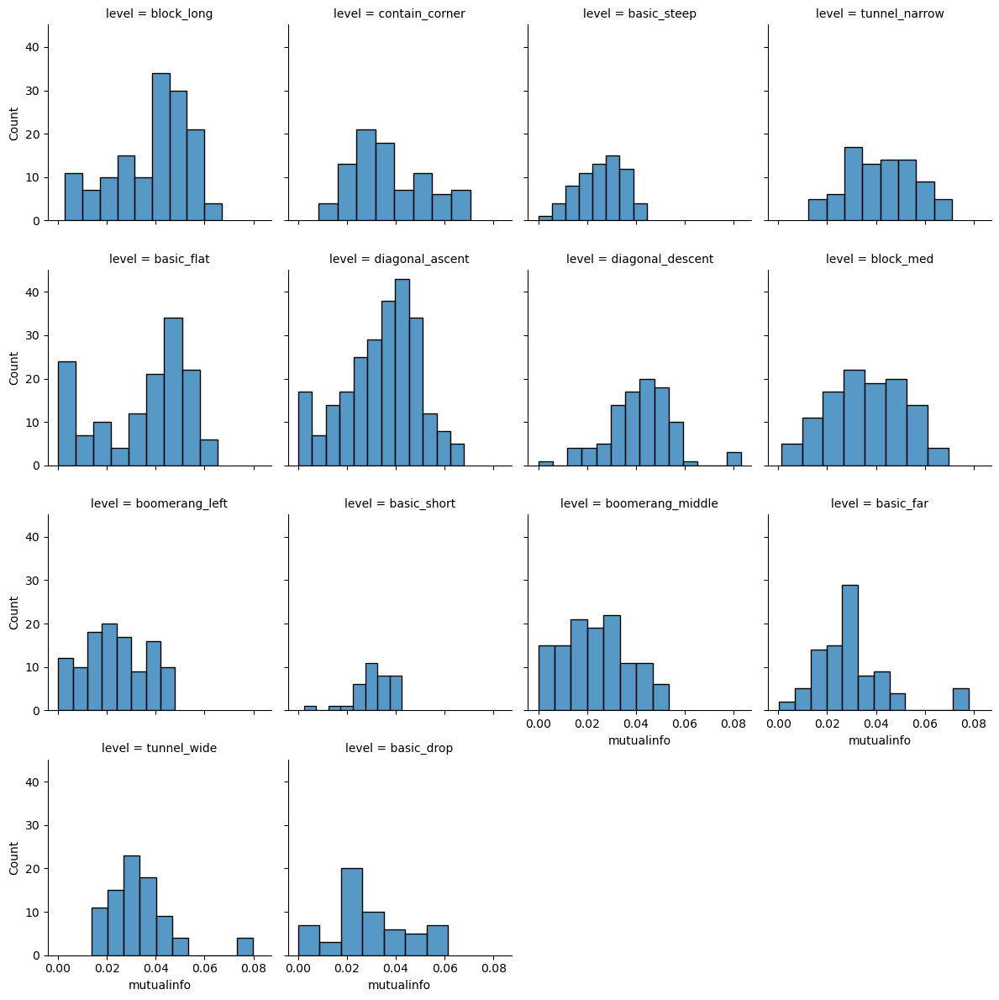

In [494]:
all_mi_toLvl_df = pd.DataFrame(all_mi_toLvl)

g = sns.FacetGrid(all_mi_toLvl_df, col="level", col_wrap=4)
g.map(sns.histplot, "mutualinfo")
g.savefig("fig/mi_levels.png")

In [515]:
np.mean(all_mi_toLvl_df['mutualinfo'])

0.03310067925662809

In [525]:
# within level variance
np.var(all_mi_toLvl_df['mutualinfo'])

0.0002526628631406212

In [541]:
all_mi_toLvl_df.groupby('level').agg({'mutualinfo': ['mean','var']})

mutualinfo          
                       mean       var
level                                
basic_drop         0.028819  0.000276
basic_far          0.030079  0.000229
basic_flat         0.033912  0.000364
basic_short        0.030966  0.000067
basic_steep        0.025418  0.000092
block_long         0.038482  0.000247
block_med          0.035714  0.000253
boomerang_left     0.023455  0.000165
boomerang_middle   0.023684  0.000198
contain_corner     0.036892  0.000232
diagonal_ascent    0.033978  0.000234
diagonal_descent   0.041894  0.000177
tunnel_narrow      0.041953  0.000190
tunnel_wide        0.033414  0.000185

In [585]:
(
    all_mi_toLvl_df
    .groupby("level")
    .apply(lambda x: x.query('mutualinfo == mutualinfo.max()'))
)

img  \
level                                                                      
basic_drop       1117  connect-7E0D9F23EB824361ABA9A049C64208D5_img1.png   
basic_far        698   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img40...   
                 701   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img41...   
                 718   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img38...   
basic_flat       669   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img27...   
basic_short      1237  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img43...   
basic_steep      134   connect-71AEE38C92B24C568F612B9014229FF4_img38...   
block_long       783   connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img29...   
block_med        719   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img1.png   
                 725   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img4.png   
boomerang_left   794   connect-1501C5CE8BBE4B789CD17DD9FDB6A737_img61...   
boomerang_middle 681   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img35...   
contain_corner   713   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img13...   
                 716   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img12...   
                 717   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img10...   
diagonal_ascent  263   connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img44...   
diagonal_descent 694   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img57...   
tunnel_narrow    285   connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img29...   
tunnel_wide      687   connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img51...   

                                  level  mutualinfo  
level                                                
basic_drop       1117        basic_drop    0.061418  
basic_far        698          basic_far    0.077879  
                 701          basic_far    0.077879  
                 718          basic_far    0.077879  
basic_flat       669         basic_flat    0.065220  
basic_short      1237       basic_short    0.042476  
basic_steep      134        basic_steep    0.044466  
block_long       783         block_long    0.066943  
block_med        719          block_med    0.069673  
                 725          block_med    0.069673  
boomerang_left   794     boomerang_left    0.047890  
boomerang_middle 681   boomerang_middle    0.053511  
contain_corner   713     contain_corner    0.070459  
                 716     contain_corner    0.070459  
                 717     contain_corner    0.070459  
diagonal_ascent  263    diagonal_ascent    0.068000  
diagonal_descent 694   diagonal_descent    0.083150  
tunnel_narrow    285      tunnel_narrow    0.071165  
tunnel_wide      687        tunnel_wide    0.079822

In [594]:
(
    all_mi_toLvl_df
    .groupby("level")
    .apply(lambda x: x.query('mutualinfo == mutualinfo.min()'))
)

img  \
level                                                                      
basic_drop       445   connect-A4CF186F80ED41E6973870DB4C597F32_img20...   
                 860   connect-6DF4BAC26DEE4F9FA7C0B8D08891B590_img52...   
                 1004  connect-4B0CE07C4F434476AF0B131C45E7AB28_img27...   
                 1242  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img42...   
                 1258  connect-B9360F5511954062A797B1228A4AF9E9_img51...   
basic_far        1040  connect-3816DCE76C6C443391050CB063B83BB3_img35...   
basic_flat       1198  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img38...   
                 1218  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img34...   
                 1219  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img35...   
                 1221  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img37...   
                 1224  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img36...   
                 1225  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img51...   
                 1230  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img50...   
                 1232  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img52...   
                 1235  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img53...   
                 1243  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img54...   
                 1248  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img55...   
basic_short      934   connect-4C241572C44A465A8DDB0D6512E80B91_img18...   
basic_steep      965   connect-4B0CE07C4F434476AF0B131C45E7AB28_img61...   
block_long       531   connect-35C167A8A69C44C6901146BCBDA40868_img0.png   
block_med        426   connect-A4CF186F80ED41E6973870DB4C597F32_img0.png   
boomerang_left   1449  connect-4E48E94501D14A318FF6D1CC407DEC30_img0.png   
boomerang_middle 56    connect-BDE67C2DF7E34C829465442702DD3ACC_img20...   
                 941   connect-4B0CE07C4F434476AF0B131C45E7AB28_img39...   
                 1201  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img29...   
                 1207  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img32...   
                 1210  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img33...   
                 1212  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img31...   
                 1215  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img30...   
                 1352  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img17...   
                 1393  connect-7CF9BDBEF5A8487E9059DF7AEDC12B6A_img34...   
contain_corner   364   connect-6F75D8B9C091457AB35203CFF4BE2103_img48...   
diagonal_ascent  1186  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img58...   
                 1187  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img59...   
                 1190  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img62...   
                 1192  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img61...   
                 1193  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img60...   
                 1204  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img28...   
                 1208  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img26...   
                 1209  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img27...   
                 1211  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img25...   
                 1216  connect-F9E998D1F7FD4763BA48455B0A2AF97F_img24...   
diagonal_descent 599   connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img8.png   
tunnel_narrow    230   connect-EC304583F3AC4B45B6B79A840A0443A0_img14...   
tunnel_wide      202   connect-EC304583F3AC4B45B6B79A840A0443A0_img88...   

                                  level  mutualinfo  
level                                                
basic_drop       445         basic_drop    0.000000  
                 860         basic_drop    0.000000  
                 1004        basic_drop    0.000000  
                 1242        basic_drop    0.000000  
                 1258        basic_drop    0.000000  
basic_far        1040         basic_far    0.000330  
basic_flat       1198        basic_flat    0.000000  
          

In [521]:
# between variance - levels avg vs overall avg
bw_mi_toLvl = []
for a in avgLevel:
    s1 = avgLevel[a]
    s1_arr = np.asarray(s1).ravel()
    s2_arr = avg_arr.ravel()
    hist_2d, x_edges, y_edges = np.histogram2d(s1_arr,s2_arr,bins=20)
    row = {'level':a, 'mutualinfo': mutual_information(hist_2d)}
    bw_mi_toLvl.append(row) 

In [524]:
bw_mi_toLvl_df = pd.DataFrame(bw_mi_toLvl)

# between level variance
np.var(bw_mi_toLvl_df['mutualinfo'])
# more between level variance than within => levels produce distinctive solutions

0.004906106242098986

### mutual information to average level * conditions

In [495]:
all_mi_toLvlCond = []

for d in Dict:
    if len(df[df['imageID'].str.contains(d)]) > 0:
        s1 = Dict[d]
        s1_arr = np.asarray(s1).ravel()
        s1_dfrow = df[df['imageID'].str.contains(d)]
        s1_levelID = s1_dfrow['levelID'].iloc[0]
        s1_gravX = str(s1_dfrow['gravX'].iloc[0])
        s2_arr = avgLevelCond[s1_levelID + "_" + s1_gravX].ravel()
        hist_2d, x_edges, y_edges = np.histogram2d(s1_arr,s2_arr,bins=20)
        row = {'img': d, 'level':s1_levelID, 'gravX':s1_gravX, 'mutualinfo': mutual_information(hist_2d)}
        all_mi_toLvlCond.append(row) 

/Users/lo2069/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


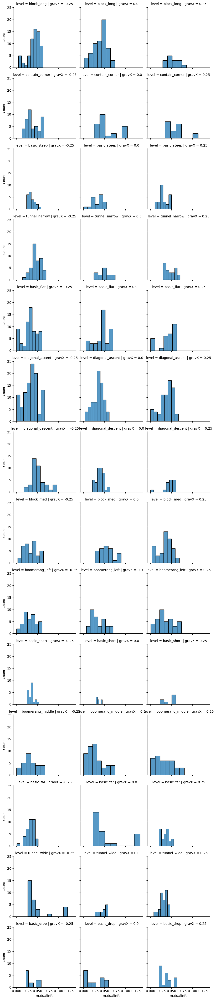

In [504]:
all_mi_toLvlCond_df = pd.DataFrame(all_mi_toLvlCond)

g = sns.FacetGrid(all_mi_toLvlCond_df, row="level", col="gravX", col_order=['-0.25','0.0','0.25'])
g.map(sns.histplot, "mutualinfo")
g.savefig("fig/mi_levelsCond.png")

In [517]:
np.mean(all_mi_toLvlCond_df['mutualinfo'])

0.038838557300316996

In [518]:
np.var(all_mi_toLvlCond_df['mutualinfo']) #surprisingly wider variance than not including wind

0.0003475006286530067

## mutual information comparison across all trials within same level

### sample for a given level

In [578]:
# get sample from dataframe
sampletrials = (
    df
    .query("levelID == 'basic_far' & gravX == 0.00")
    .groupby("subjID")
    .apply(lambda x: x.query("numAttempts == numAttempts.max()"))
    .loc[:, 'imageID']
)

In [779]:
# get mutual information between each trial
sampleMIbw = []
axis_imgs_samp = []
# full matrix combination
for s in sampletrials:
    axis_imgs_samp.append(Dict[s])
    for t in sampletrials: 
        row = {'imgA': s, 'imgB': t, 'mutualinfo': compareImgs(s, t)}
        sampleMIbw.append(row)

# # matrix triangle
# for s in range(0,len(sampletrials)):
#     axis_imgs_samp.append(Dict[sampletrials[s]])
#     for t in range(s+1, len(sampletrials)): 
#         imgA = sampletrials[s]
#         imgB = sampletrials[t]
#         row = {'imgA': imgA, 'imgB': imgB, 'mutualinfo': compareImgs(imgA, imgB)}
#         sampleMIbw.append(row)

In [780]:
sampleMIbwdf = pd.DataFrame(sampleMIbw)
(
    sampleMIbwdf
    .query("imgA != imgB")
    .agg({"mutualinfo": ["mean","var"]})
)

,mutualinfo
mean,0.003261
var,0.000031


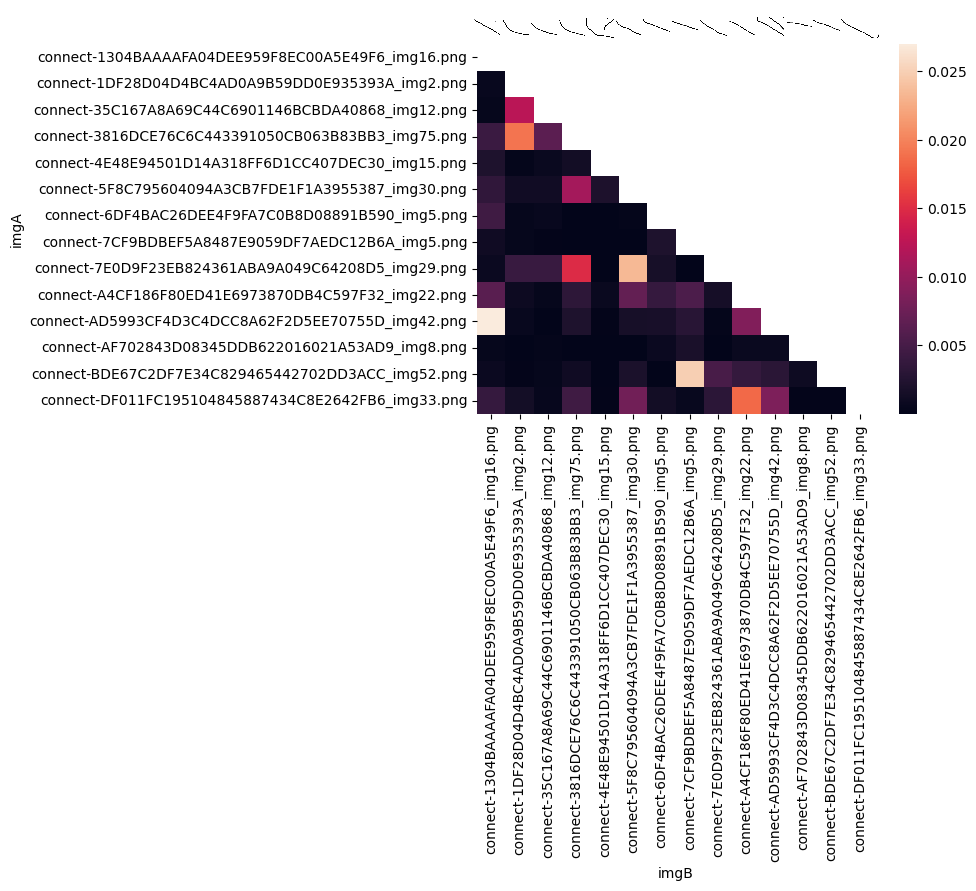

In [781]:
samplemipivot = sampleMIbwdf.pivot(index="imgA", columns="imgB", values="mutualinfo")
# samplehm = sns.heatmap(samplemipivot)
samplehm = sns.heatmap(samplemipivot, mask=np.triu(samplemipivot))

tick_labels = samplehm.xaxis.get_ticklabels()

for i,im in enumerate(axis_imgs_samp):
    ib = OffsetImage(im, zoom=.035)
    ib.image.axes = samplehm
    ab = AnnotationBbox(ib,
                    tick_labels[i].get_position(),
                    frameon=False,
                    box_alignment=(0.5, 0)
                    )
    samplehm.add_artist(ab)

In [739]:
(
    sampleMIbwdf
    .query('imgA != imgB')
)

,imgA,imgB,mutualinfo
1,connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img16...,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img2.png,0.000594
2,connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img16...,connect-35C167A8A69C44C6901146BCBDA40868_img12...,0.000317
3,connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img16...,connect-3816DCE76C6C443391050CB063B83BB3_img75...,0.004143
4,connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img16...,connect-4E48E94501D14A318FF6D1CC407DEC30_img15...,0.002112
5,connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img16...,connect-5F8C795604094A3CB7FDE1F1A3955387_img30...,0.003467
...,...,...,...
190,connect-DF011FC195104845887434C8E2642FB6_img33...,connect-7E0D9F23EB824361ABA9A049C64208D5_img29...,0.003083
191,connect-DF011FC195104845887434C8E2642FB6_img33...,connect-A4CF186F80ED41E6973870DB4C597F32_img22...,0.018457
192,connect-DF011FC195104845887434C8E2642FB6_img33...,connect-AD5993CF4D3C4DCC8A62F2D5EE70755D_img42...,0.008628
193,connect-DF011FC195104845887434C8E2642FB6_img33...,connect-AF702843D08345DDB622016021A53AD9_img8.png,0.000170


In [798]:
# full mutual information between each trial
## matrix triangle for each level
MIbw = []
for l in df['levelID'].unique():
    levelAtt = (
        df
        .query("levelID == @l")
        .groupby(["subjID","gravX"])
        .apply(lambda x: x.query("numAttempts == numAttempts.max()"))
        .loc[:, 'imageID']
    )
    
    for s in range(0,len(levelAtt)):
        for t in range(s+1, len(levelAtt)): 
            imgA = levelAtt[s]
            imgB = levelAtt[t]
            row = { 'levelID':l, 'imgA': imgA, 'imgB': imgB, 'mutualinfo': compareImgs(imgA, imgB)}
            MIbw.append(row)

In [802]:
MIbw_combos = pd.DataFrame(MIbw)
MIbw_combos.head()

,levelID,imgA,imgB,mutualinfo
0,basic_far,connect-0F07CDB90B904FB79C385106E46337DE_img14...,connect-0F07CDB90B904FB79C385106E46337DE_img23...,0.000430
1,basic_far,connect-0F07CDB90B904FB79C385106E46337DE_img14...,connect-0F07CDB90B904FB79C385106E46337DE_img34...,0.016532
2,basic_far,connect-0F07CDB90B904FB79C385106E46337DE_img14...,connect-1304BAAAAFA04DEE959F8EC00A5E49F6_img16...,0.000123
3,basic_far,connect-0F07CDB90B904FB79C385106E46337DE_img14...,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img27...,0.001005
4,basic_far,connect-0F07CDB90B904FB79C385106E46337DE_img14...,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img32...,0.000114


<Axes: xlabel='mutualinfo', ylabel='Count'>

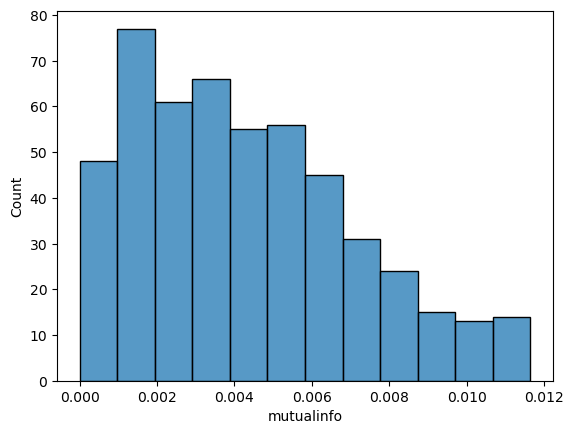

In [825]:
MIbw_df = (
    MIbw_combos
    .set_index(['levelID', 'mutualinfo'])
    .stack()
    .reset_index(name='imageID')
    .groupby('imageID')
    .agg({'mutualinfo':'mean'})
)

sns.histplot(MIbw_df, x="mutualinfo")

### retrieve amount of ink from pixel matrices

In [722]:
# calculate number of non-black pixels
inks = []
for i in Dict:
    si = Dict[i]
    ink = np.count_nonzero(np.array(si) != [255, 255, 255, 255])
    row = {'imageID': i, 'ink': ink}
    inks.append(row)

ink_df = pd.DataFrame(inks)
sns.histplot(ink_df, x="ink")

,imageID,ink
0,connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img38...,30921
1,connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img10...,37587
2,connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img11...,40383
3,connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img39...,30921
4,connect-F8D52DE7E5634302BB8D6890E6DDBA3F_img13...,39753


### retrieve number of strokes from trial dataframe

In [838]:
trials = pd.read_csv("trialdf.csv").merge(df, how='left', 
                                          on=['subjID','levelID','gravX','gravY','radius','numAttempts'])
    
trials.head()

,Unnamed: 0,subjID,starttime,useragent,exptPart,numTrial,levelIndex,levelID,marbleStartLoc,cupLoc,...,marbleMinDist,runOutcome,drawnLines,drawnPhysObj,trialStartTime,drawTime,runTime,success,imageID,directory
0,1,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,0,0,basic_far,"{'x': 0.1, 'y': 0.075}","{'x': 0.9, 'y': 0.9}",...,102.356402,outofbound,"[[{'x': 61, 'y': 126}, {'x': 71, 'y': 140}, {'...","[[{'x': 61, 'y': 126, 'r': 8}, [{'x': 64, 'y':...",1703865268895,7900,975,fail,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img0.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...
1,2,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,0,0,basic_far,"{'x': 0.1, 'y': 0.075}","{'x': 0.9, 'y': 0.9}",...,3.322696,outofbound,"[[{'x': 61, 'y': 126}, {'x': 71, 'y': 140}, {'...","[[{'x': 61, 'y': 126, 'r': 8}, [{'x': 64, 'y':...",1703865268895,13908,1212,fail,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img1.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...
2,3,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,0,0,basic_far,"{'x': 0.1, 'y': 0.075}","{'x': 0.9, 'y': 0.9}",...,0.000000,goal,"[[{'x': 61, 'y': 126}, {'x': 71, 'y': 140}, {'...","[[{'x': 61, 'y': 126, 'r': 8}, [{'x': 64, 'y':...",1703865268895,25708,3192,success,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img2.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...
3,4,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,1,13,boomerang_left,"{'x': 0.35, 'y': 0.075}","{'x': 0.35, 'y': 0.9}",...,276.385230,outofbound,"[[{'x': 647, 'y': 338}, {'x': 632, 'y': 346}, ...","[[{'x': 647, 'y': 338, 'r': 8}, [{'x': 626, 'y...",1703865298230,5485,887,fail,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img3.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...
4,5,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,1,13,boomerang_left,"{'x': 0.35, 'y': 0.075}","{'x': 0.35, 'y': 0.9}",...,276.385230,outofbound,"[[{'x': 647, 'y': 338}, {'x': 632, 'y': 346}, ...","[[{'x': 647, 'y': 338, 'r': 8}, [{'x': 626, 'y...",1703865298230,12393,883,fail,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img4.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...


<Axes: xlabel='numStrokes', ylabel='Count'>

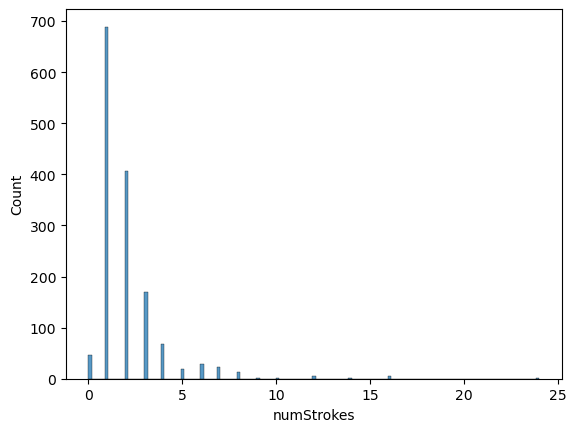

In [839]:
def countStrokes(linesString):
    return len(ast.literal_eval(linesString))

trials = (
    trials
    .assign(numStrokes = trials.apply(lambda x: countStrokes(x['drawnLines']), axis=1))
)

# histogram of stroke count
sns.histplot(trials, x="numStrokes")

In [840]:
# merge amount of ink
trials = trials.merge(ink_df, how="left", on="imageID")
# merge mutual information to avg level
trials = (
    trials
    .merge(all_mi_toLvl_df, how="left", left_on=["imageID", "levelID"], right_on=["img","level"])
    .rename(columns={'mutualinfo': 'mutualinfoToAvg'})
)

trials = (
    trials
    .merge(MIbw_df, how="left", on="imageID")
    .rename(columns={'mutualinfo': 'mutualinfoBw'})
)

trials.head()

,Unnamed: 0,subjID,starttime,useragent,exptPart,numTrial,levelIndex,levelID,marbleStartLoc,cupLoc,...,runTime,success,imageID,directory,numStrokes,ink,img,level,mutualinfoToAvg,mutualinfoBw
0,1,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,0,0,basic_far,"{'x': 0.1, 'y': 0.075}","{'x': 0.9, 'y': 0.9}",...,975,fail,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img0.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...,1,26622,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img0.png,basic_far,0.021153,NaN
1,2,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,0,0,basic_far,"{'x': 0.1, 'y': 0.075}","{'x': 0.9, 'y': 0.9}",...,1212,fail,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img1.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...,1,25335,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img1.png,basic_far,0.019293,NaN
2,3,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,0,0,basic_far,"{'x': 0.1, 'y': 0.075}","{'x': 0.9, 'y': 0.9}",...,3192,success,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img2.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...,1,31695,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img2.png,basic_far,0.027100,0.001993
3,4,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,1,13,boomerang_left,"{'x': 0.35, 'y': 0.075}","{'x': 0.35, 'y': 0.9}",...,887,fail,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img3.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...,1,768,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img3.png,boomerang_left,0.000106,NaN
4,5,connect-1DF28D04D4BC4AD0A9B59DD0E935393A,1703865018453,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,test,1,13,boomerang_left,"{'x': 0.35, 'y': 0.075}","{'x': 0.35, 'y': 0.9}",...,883,fail,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img4.png,connect-1DF28D04D4BC4AD0A9B59DD0E935393A/conne...,1,768,connect-1DF28D04D4BC4AD0A9B59DD0E935393A_img4.png,boomerang_left,0.000106,NaN


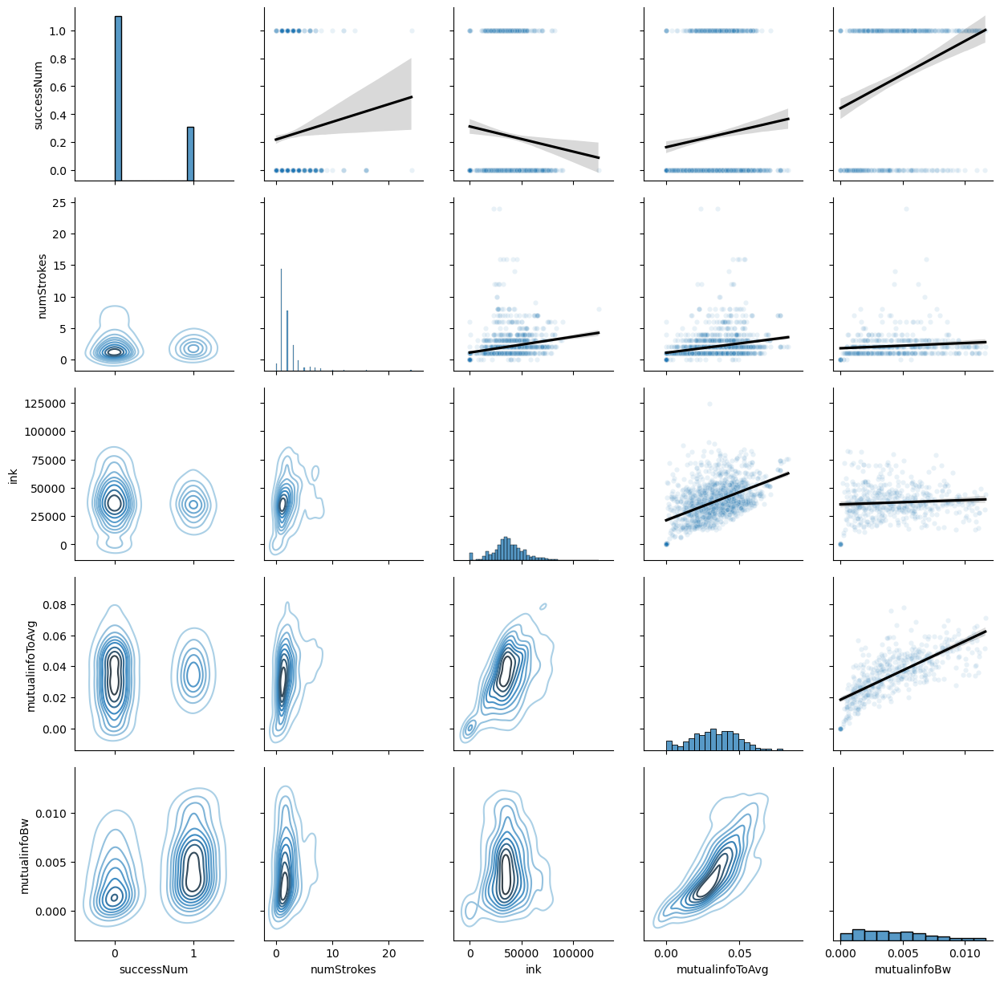

In [930]:
trialmeasures = (
    trials
#     .dropna()
    .assign(successNum = (trials['success'] == 'success').astype(int))
    .loc[:, ['successNum','numStrokes','ink','mutualinfoToAvg','mutualinfoBw']]
)
    
# trialmeasures
g = sns.PairGrid(trialmeasures)
g.map_diag(sns.histplot)
g.map_upper(sns.regplot, scatter_kws=dict(alpha=0.1, s=20, edgecolors='white'), line_kws=dict(color='black'))
g.map_lower(sns.kdeplot, cmap="Blues_d")
g.savefig("fig/corrs.png")

In [931]:
trialmeasures.corr()

,successNum,numStrokes,ink,mutualinfoToAvg,mutualinfoBw
successNum,1.000000,0.057861,-0.066236,0.089463,0.283304
numStrokes,0.057861,1.000000,0.202907,0.239970,0.118029
ink,-0.066236,0.202907,1.000000,0.497378,0.073978
mutualinfoToAvg,0.089463,0.239970,0.497378,1.000000,0.731916
mutualinfoBw,0.283304,0.118029,0.073978,0.731916,1.000000
